In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as sps
sns.set()

plt.rc('font', size=30)
plt.rc('axes', titlesize=30)
plt.rc('axes', labelsize=30)
plt.rc('xtick', labelsize=30)
plt.rc('ytick', labelsize=30)
plt.rc('legend', fontsize=30)
plt.rc('figure', titlesize=30)

from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.covariance import MinCovDet
import cvxpy as cvx

Датафрейм returns - это таблица доходностей, то есть $\frac{p_{new} - p_{old}}{p_{old}}$.

In [3]:
returns = pd.read_csv('work/data/returns.csv')
returns = returns.fillna(0)
returns['date'] = returns['date'].astype(np.datetime64)
returns = returns.set_index('date')
returns

,MPWR,CCI,ESS,D,MRK,LYB,MLM,CAG,XEL,AMG,...,FL,ZBRA,THC,BR,EVRG,URBN,ANF,TIE,INTU,SPY
date,,,,,,,,,,,,,,,,,,,,,
2012-01-03,0.008617,0.002673,-0.001422,-0.010919,0.015902,0.030153,0.004373,-0.004202,-0.010835,0.016249,...,0.006281,-0.001677,-0.033134,0.005345,0.000000,0.006894,0.001017,0.040086,-0.002469,0.015934
2012-01-04,-0.022360,0.002232,-0.016461,-0.008197,0.001041,0.037907,-0.000397,0.008374,-0.006582,0.002974,...,0.005409,-0.007558,-0.054445,-0.002685,0.000000,0.023784,-0.033332,-0.007093,-0.003043,0.001568
2012-01-05,0.022867,-0.000896,0.018621,-0.002108,0.010437,-0.014373,0.002369,-0.000761,0.004399,0.004400,...,0.025710,-0.001410,0.014928,0.003554,0.000000,-0.015134,-0.028995,-0.019374,0.004588,0.002663
2012-01-06,0.000000,0.001563,-0.004206,-0.010198,-0.006946,0.006150,-0.022404,-0.002664,-0.002921,-0.002133,...,0.008877,-0.008192,0.048315,-0.005259,0.000000,-0.011080,-0.021353,0.011868,0.013890,-0.002577
2012-01-09,0.026294,0.012886,-0.003637,-0.001366,-0.002110,-0.003796,0.009040,0.003818,0.000757,0.020093,...,0.002800,-0.004558,0.022043,0.007499,0.000000,0.040108,0.016019,0.005198,0.001137,0.002427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-26,0.022948,-0.005771,-0.001548,-0.008816,-0.004498,0.005077,0.018957,-0.010897,-0.006742,-0.000316,...,-0.033187,0.002192,0.003232,-0.009898,0.000794,-0.056878,-0.041292,0.000000,0.008123,0.002088
2021-04-27,-0.011632,-0.007309,0.000539,-0.004958,-0.002191,-0.000279,0.000361,-0.003772,-0.008512,0.018091,...,0.028386,0.006521,0.010379,0.001303,-0.009923,0.034706,0.026156,0.000000,-0.005189,-0.000216
2021-04-28,-0.019426,0.002436,-0.033900,-0.008295,-0.003492,0.013819,-0.006794,-0.001893,-0.002703,-0.009009,...,0.002375,-0.010264,0.043925,-0.001363,0.005725,0.000798,-0.000515,0.000000,-0.000768,-0.000287


In [4]:
def decrease_risk(mu, Sigma, R):
    p = len(mu)
    w = cvx.Variable(p)
    obj = cvx.Minimize(1/2 * cvx.quad_form(w, Sigma))
    
    equal_constraints_1 = [mu.T @ w == R]
    equal_constraints_2 = [np.ones(p) @ w == 1]
    eyes = np.eye(p)
    nonequal_constraints = [eye @ w >= 0 for eye in eyes]
    constraints = equal_constraints_1 + equal_constraints_2 + nonequal_constraints
    
    problem = cvx.Problem(obj, constraints=constraints)
    result = problem.solve(verbose=True, solver="SCS")
    
    opt_weights = w.value
    return opt_weights

In [5]:
train_size = 1500

returns_train = returns[:train_size]
returns_test = returns[train_size:]

In [6]:
num_of_companies = 20

mean = returns_train[returns_train.columns].mean()
top_returns = returns_train[mean.sort_values(ascending=False)[:num_of_companies].index]
top_returns.columns

Index(['NFLX', 'TSLA', 'NKTR', 'NVDA', 'ABMD', 'STZ', 'ALGN', 'AVGO', 'INCY',
       'ILMN', 'MU', 'NXPI', 'TTWO', 'DXCM', 'REGN', 'MPWR', 'DAL', 'LUV',
       'CSC', 'VRTX'],
      dtype='object')

In [7]:
mu = mean.sort_values(ascending=False)[:num_of_companies].to_numpy()
mu[:5], mu.shape

(array([0.00248749, 0.00212164, 0.00211797, 0.00203331, 0.00193894]), (20,))

In [8]:
R = 2e-3
Sigma = top_returns[top_returns.columns].cov()
Sigma[['NFLX', 'TSLA', 'NKTR', 'NVDA', 'ABMD']][:5]

,NFLX,TSLA,NKTR,NVDA,ABMD
NFLX,0.001069,0.000230,0.000156,0.000146,0.000121
TSLA,0.000230,0.000934,0.000200,0.000138,0.000113
NKTR,0.000156,0.000200,0.001174,0.000169,0.000161
NVDA,0.000146,0.000138,0.000169,0.000476,0.000117
ABMD,0.000121,0.000113,0.000161,0.000117,0.000763


In [9]:
w_no_opt = decrease_risk(mu, Sigma, R)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:14:17 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:14:17 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:14:17 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:14:17 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:14:17 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:14:17 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

In [10]:
def count_portfolio_return(colums, weights, test):
    portfolio_return = 0
    for w, col in zip(weights, columns):
        one_company_return = w * (test[col] + 1).cumprod()
        portfolio_return += one_company_return
    return portfolio_return

In [11]:
columns = top_returns.columns.to_numpy()
portfolio_return_no_opt = count_portfolio_return(columns, w_no_opt, returns_test)
portfolio_return_no_opt

date
2017-12-18    1.005896
2017-12-19    1.001772
2017-12-20    1.004200
2017-12-21    0.997490
2017-12-22    0.998036
                ...   
2021-04-26    2.856109
2021-04-27    2.800665
2021-04-28    2.784579
2021-04-29    2.752533
2021-04-30    2.779777
Name: NFLX, Length: 847, dtype: float64

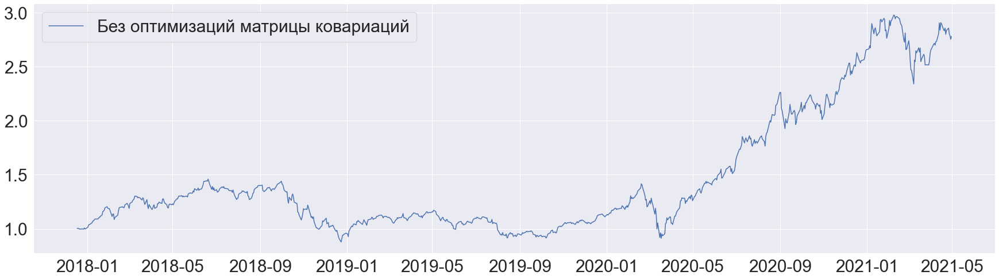

In [12]:
plt.figure(figsize=(30, 8))
#plt.yscale('log')

plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.legend();

Попробуем применить PCA к исходным данным.

In [13]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)

data = np.array([[1, 0],
                 [0, 1], 
                 [1, 1]])
pca.fit(data)
pca.inverse_transform(pca.transform(data))
pca.components_

array([[ 0.70710678, -0.70710678],
       [ 0.70710678,  0.70710678]])

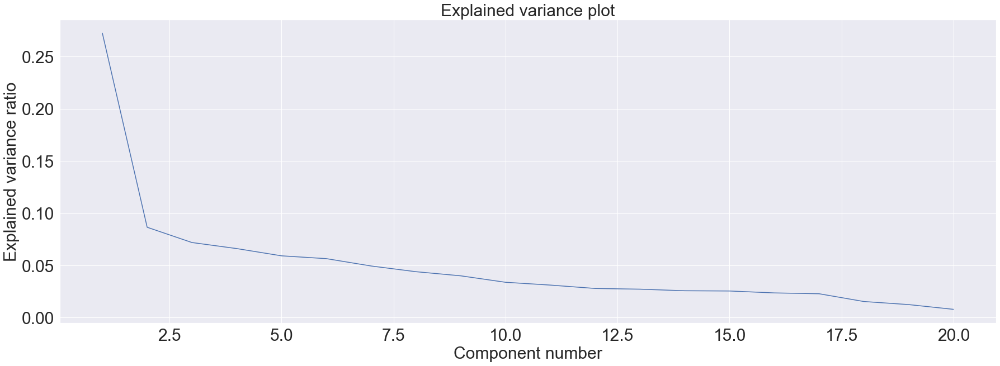

In [14]:
from sklearn.decomposition import PCA
pca = PCA(n_components=20)
pca.fit(top_returns)

fig, ax = plt.subplots(figsize=(30, 10))
ax.set_title("Explained variance plot")
ax.set_xlabel("Component number")
ax.set_ylabel("Explained variance ratio")
plt.plot(np.arange(pca.n_components) + 1, pca.explained_variance_ratio_);

In [15]:
transformed_top_returns = pca.transform(top_returns)
transformed_top_returns.shape

(1500, 20)

In [16]:
kept_components = 8
transformed_top_returns[:,kept_components:] = 0
transformed_top_returns.shape

(1500, 20)

In [17]:
simplified_returns = pca.inverse_transform(transformed_top_returns)
simplified_returns.shape

(1500, 20)

In [18]:
mu = np.mean(simplified_returns, axis=0)

R = 2e-3
Sigma = np.cov(simplified_returns.T)

w_8 = decrease_risk(mu, Sigma, R)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:14:18 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:14:18 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:14:18 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:14:18 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:14:18 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:14:18 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

In [19]:
w_8, len(w_8), np.sum(w_8)

(array([ 1.61036478e-01,  4.95939709e-02,  3.01111574e-02,  3.18299529e-01,
        -5.61605353e-06,  4.41133189e-01, -8.75878332e-06, -8.95567701e-06,
        -1.06749432e-05, -1.17025152e-05, -1.08286399e-05, -1.16227894e-05,
        -1.19134982e-05, -1.24954963e-05, -1.25567036e-05, -1.28344082e-05,
        -1.36846853e-05, -1.40910959e-05, -1.40238893e-05, -1.43567303e-05]),
 20,
 1.0000002090094433)

In [20]:
columns = top_returns.columns.to_numpy()
portfolio_return_8 = count_portfolio_return(columns, w_8, returns_test)
portfolio_return_8

date
2017-12-18    1.006156
2017-12-19    1.000848
2017-12-20    1.004202
2017-12-21    1.004811
2017-12-22    1.002713
                ...   
2021-04-26    2.505430
2021-04-27    2.470312
2021-04-28    2.455788
2021-04-29    2.456097
2021-04-30    2.459285
Name: NFLX, Length: 847, dtype: float64

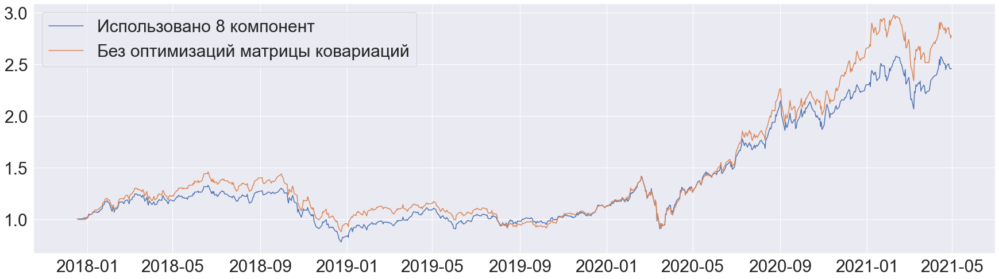

In [21]:
plt.figure(figsize=(30, 8))

plt.plot(portfolio_return_8.index, portfolio_return_8, label='Использовано 8 компонент')
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.legend();

In [22]:
transformed_top_returns = pca.transform(top_returns)

kept_components = 3
transformed_top_returns[:,kept_components:] = 0

simplified_returns = pca.inverse_transform(transformed_top_returns)

mu = np.mean(simplified_returns, axis=0)

R = 2e-3
Sigma = np.cov(simplified_returns.T)

w_3 = decrease_risk(mu, Sigma, R)

columns = top_returns.columns.to_numpy()
portfolio_return_3 = count_portfolio_return(columns, w_3, returns_test)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:14:18 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:14:18 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:14:18 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:14:18 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:14:18 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:14:18 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

In [23]:
transformed_top_returns = pca.transform(top_returns)

kept_components = 12
transformed_top_returns[:,kept_components:] = 0

simplified_returns = pca.inverse_transform(transformed_top_returns)

mu = np.mean(top_returns.to_numpy(), axis=0)

R = 2e-3
Sigma = np.cov(simplified_returns.T)

w_12 = decrease_risk(mu, Sigma, R)

columns = top_returns.columns.to_numpy()
portfolio_return_12 = count_portfolio_return(columns, w_12, returns_test)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:14:18 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:14:18 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:14:18 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:14:18 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:14:18 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:14:18 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

In [24]:
transformed_top_returns = pca.transform(top_returns)

kept_components = 5
transformed_top_returns[:,kept_components:] = 0

simplified_returns = pca.inverse_transform(transformed_top_returns)

mu = np.mean(top_returns.to_numpy(), axis=0)

R = 2e-3
Sigma = np.cov(simplified_returns.T)

w_5 = decrease_risk(mu, Sigma, R)

columns = top_returns.columns.to_numpy()
portfolio_return_5 = count_portfolio_return(columns, w_5, returns_test)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:14:18 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:14:18 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:14:18 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:14:18 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:14:18 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:14:18 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

In [25]:
np.mean(top_returns.to_numpy(), axis=0)

array([0.00248749, 0.00212164, 0.00211797, 0.00203331, 0.00193894,
       0.00177612, 0.00176269, 0.00174744, 0.00168993, 0.00163993,
       0.00163726, 0.00162181, 0.00162123, 0.00160102, 0.00158497,
       0.00156813, 0.00154842, 0.0015262 , 0.00152034, 0.00150349])

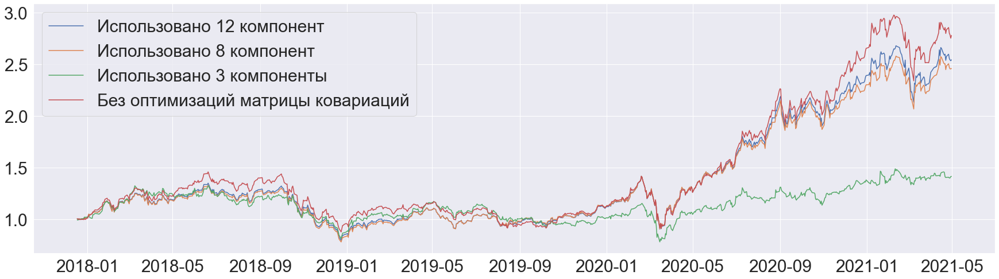

In [26]:
plt.figure(figsize=(30, 8))

plt.plot(portfolio_return_12.index, portfolio_return_12, label='Использовано 12 компонент')
plt.plot(portfolio_return_8.index, portfolio_return_8, label='Использовано 8 компонент')
plt.plot(portfolio_return_3.index, portfolio_return_3, label='Использовано 3 компоненты')
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.legend();

Поиграемся с данными немного.

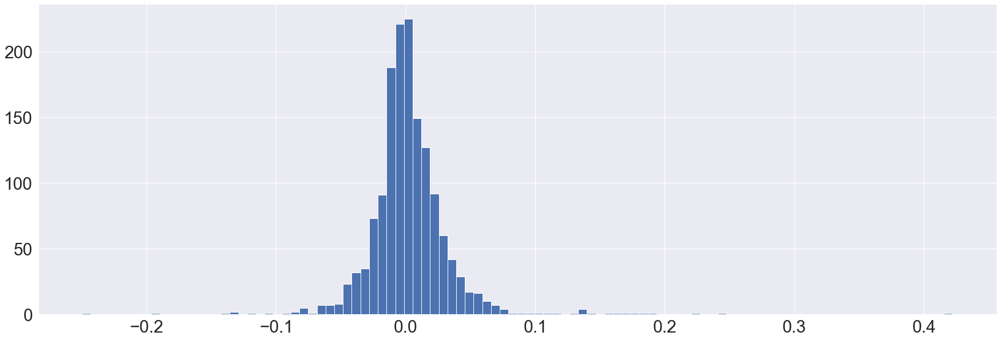

In [27]:
plt.figure(figsize=(30, 10))
plt.hist(top_returns['NFLX'].to_numpy(), bins=100);

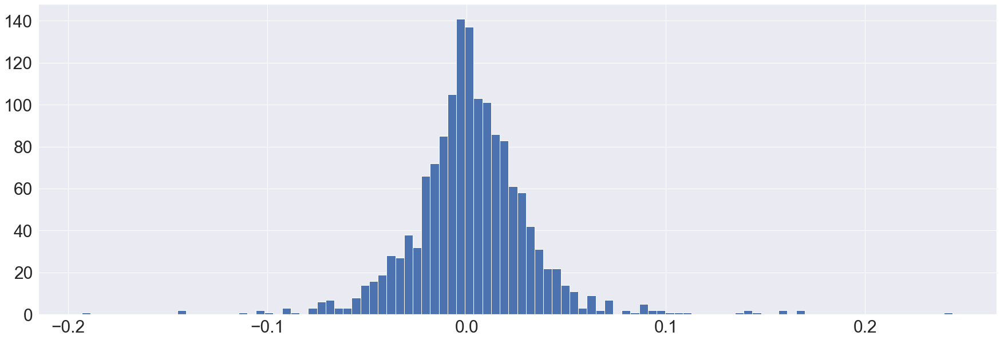

In [28]:
plt.figure(figsize=(30, 10))
plt.hist(top_returns['TSLA'].to_numpy(), bins=100);

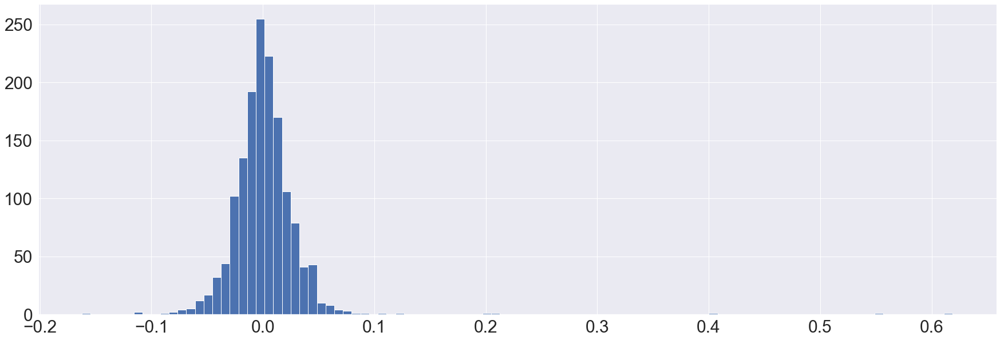

In [29]:
plt.figure(figsize=(30, 10))
plt.hist(top_returns['VRTX'].to_numpy(), bins=100);

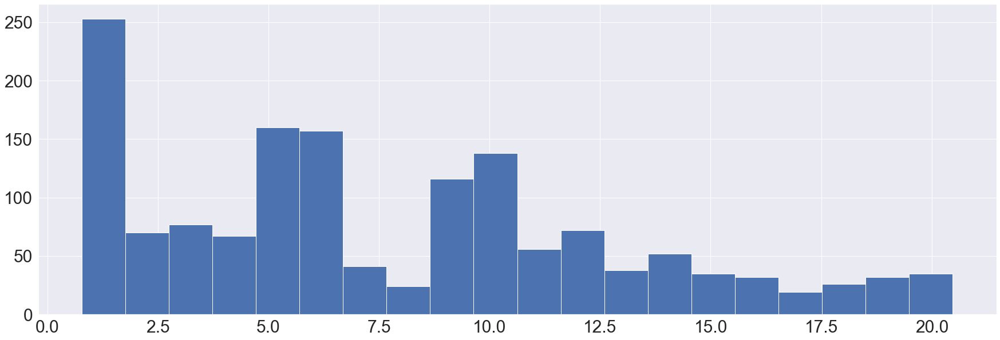

In [30]:
top_returns_add = (top_returns + 1).cumprod(axis=0)

plt.figure(figsize=(30, 10))
plt.hist(top_returns_add['NFLX'].to_numpy(), bins=20);

In [31]:
%run single_ppca.py
%load_ext autoreload
%autoreload 2

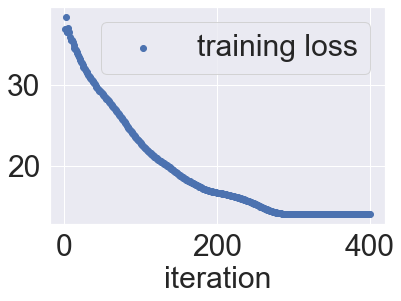

13.934592247009277


In [32]:
import single_ppca

W, mu, logsigma2 = single_ppca.find_params(top_returns.to_numpy(), 8)

In [33]:
transformed_top_returns = single_ppca.transform(top_returns.to_numpy(), W, mu, logsigma2, type='optimal')

In [34]:
def get_test_returns(transformed_top_returns):
    Sigma = np.cov(transformed_top_returns.T)

    means = np.mean(top_returns.to_numpy(), axis=0)

    w_ppca_8 = decrease_risk(means, Sigma, R)

    columns = top_returns.columns.to_numpy()
    return count_portfolio_return(columns, w_ppca_8, returns_test) 

In [35]:
portfolio_return_ppca_8 = get_test_returns(transformed_top_returns)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:14:26 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:14:26 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:14:26 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:14:26 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:14:26 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:14:26 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

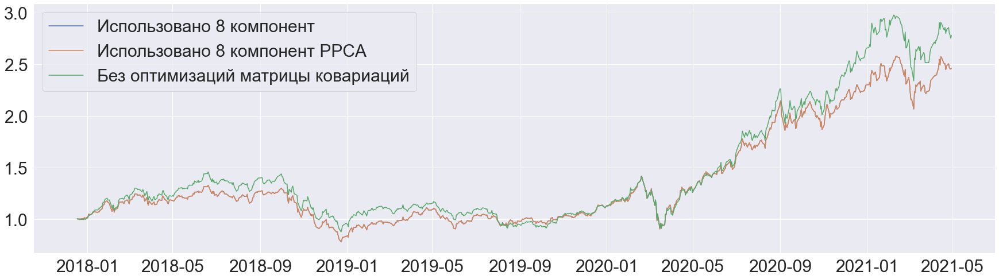

In [36]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_8.index, portfolio_return_8, label='Использовано 8 компонент')
plt.plot(portfolio_return_ppca_8.index, portfolio_return_ppca_8, label='Использовано 8 компонент PPCA')
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.legend();

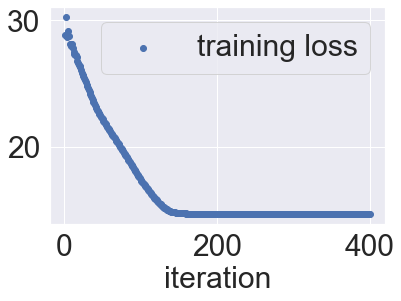

14.646163940429688
                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:14:31 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:14:31 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:14:31 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:14:31 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:14:31 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:14:31 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> Co

In [37]:
W, mu, logsigma2 = single_ppca.find_params(top_returns.to_numpy(), 5)
transformed_top_returns = single_ppca.transform(top_returns.to_numpy(), W, mu, logsigma2, type='optimal')
portfolio_return_ppca_5 = get_test_returns(transformed_top_returns)

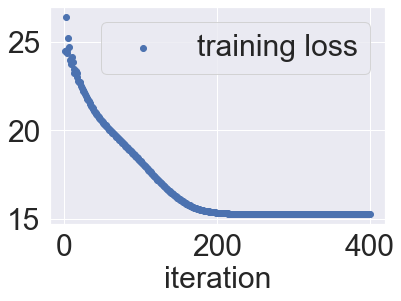

15.248568534851074
                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:14:37 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:14:37 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:14:37 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:14:37 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:14:37 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:14:37 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> Co

In [38]:
W, mu, logsigma2 = single_ppca.find_params(top_returns.to_numpy(), 3)
transformed_top_returns = single_ppca.transform(top_returns.to_numpy(), W, mu, logsigma2, type='optimal')
portfolio_return_ppca_3 = get_test_returns(transformed_top_returns)

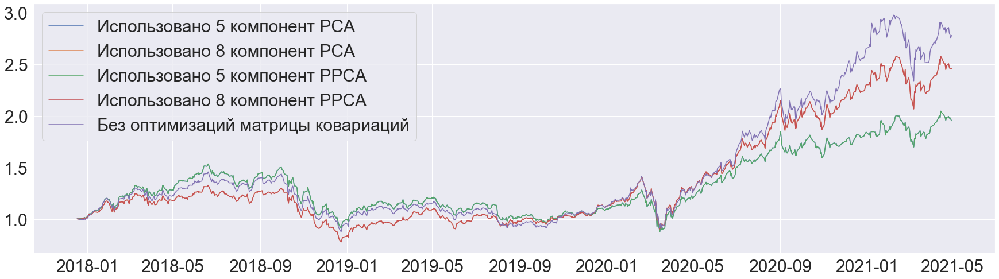

In [39]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_5.index, portfolio_return_5, label='Использовано 5 компонент PCA')
plt.plot(portfolio_return_8.index, portfolio_return_8, label='Использовано 8 компонент PCA')
plt.plot(portfolio_return_ppca_5.index, portfolio_return_ppca_5, label='Использовано 5 компонент PPCA')
plt.plot(portfolio_return_ppca_8.index, portfolio_return_ppca_8, label='Использовано 8 компонент PPCA')
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.legend();

Попробуем получить данные при помощи генеративной модели.

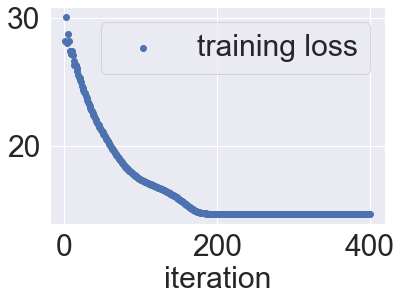

14.648727416992188


In [40]:
W, mu, logsigma2 = single_ppca.find_params(top_returns.to_numpy(), 5)

In [41]:
generated_returns = single_ppca.generate(top_returns.shape[0], W, mu, logsigma2)
portfolio_return_ppca_gen_5_1 = get_test_returns(generated_returns)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:14:42 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:14:42 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:14:42 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:14:42 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:14:42 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:14:42 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

In [42]:
generated_returns = single_ppca.generate(top_returns.shape[0], W, mu, logsigma2)
portfolio_return_ppca_gen_5_2 = get_test_returns(generated_returns)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:14:43 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:14:43 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:14:43 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:14:43 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:14:43 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:14:43 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

In [43]:
generated_returns = single_ppca.generate(top_returns.shape[0], W, mu, logsigma2)
portfolio_return_ppca_gen_5_3 = get_test_returns(generated_returns)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:14:43 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:14:43 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:14:43 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:14:43 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:14:43 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:14:43 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

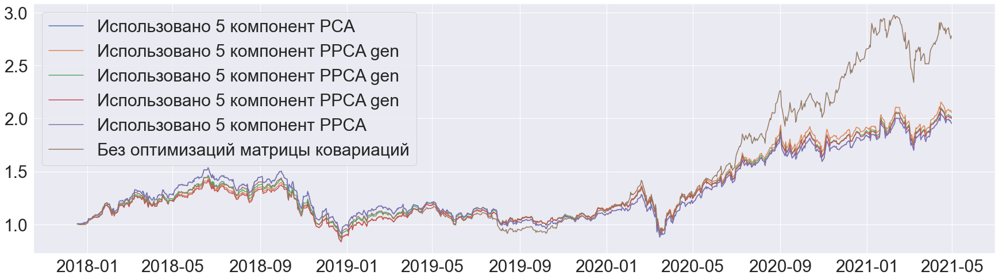

In [44]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_5.index, portfolio_return_5, label='Использовано 5 компонент PCA')
plt.plot(portfolio_return_ppca_gen_5_1.index, portfolio_return_ppca_gen_5_1, label='Использовано 5 компонент PPCA gen')
plt.plot(portfolio_return_ppca_gen_5_2.index, portfolio_return_ppca_gen_5_2, label='Использовано 5 компонент PPCA gen')
plt.plot(portfolio_return_ppca_gen_5_3.index, portfolio_return_ppca_gen_5_3, label='Использовано 5 компонент PPCA gen')
plt.plot(portfolio_return_ppca_5.index, portfolio_return_ppca_5, label='Использовано 5 компонент PPCA')
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.legend();

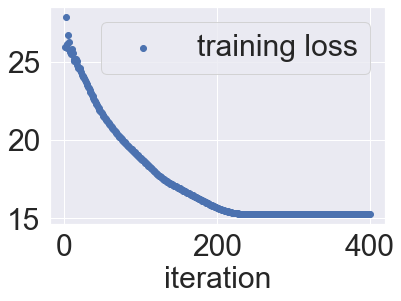

15.248571395874023
                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:14:49 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:14:49 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:14:49 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:14:49 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:14:49 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:14:49 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> Co

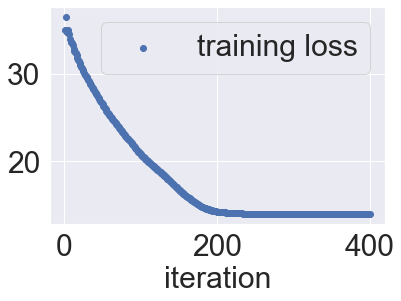

13.933279037475586
                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:14:53 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:14:53 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:14:53 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:14:53 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:14:53 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:14:53 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> Co

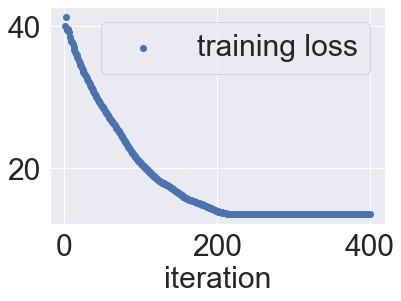

13.546998023986816
                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:14:58 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:14:58 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:14:58 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:14:58 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:14:58 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:14:58 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> Co

In [45]:
W, mu, logsigma2 = single_ppca.find_params(top_returns.to_numpy(), 3)
generated_returns = single_ppca.generate(top_returns.shape[0], W, mu, logsigma2)
portfolio_return_ppca_gen_3 = get_test_returns(generated_returns)

W, mu, logsigma2 = single_ppca.find_params(top_returns.to_numpy(), 8)
generated_returns = single_ppca.generate(top_returns.shape[0], W, mu, logsigma2)
portfolio_return_ppca_gen_8 = get_test_returns(generated_returns)

W, mu, logsigma2 = single_ppca.find_params(top_returns.to_numpy(), 12)
generated_returns = single_ppca.generate(top_returns.shape[0], W, mu, logsigma2)
portfolio_return_ppca_gen_12 = get_test_returns(generated_returns)

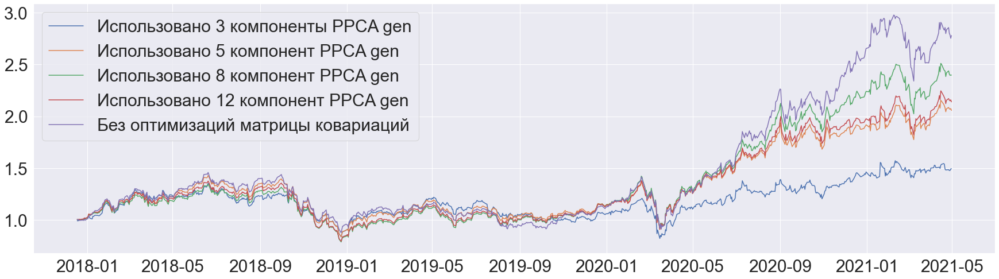

In [46]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_ppca_gen_5_2.index, portfolio_return_ppca_gen_3, label='Использовано 3 компоненты PPCA gen')
plt.plot(portfolio_return_ppca_gen_5_1.index, portfolio_return_ppca_gen_5_1, label='Использовано 5 компонент PPCA gen')
plt.plot(portfolio_return_ppca_gen_5_2.index, portfolio_return_ppca_gen_8, label='Использовано 8 компонент PPCA gen')
plt.plot(portfolio_return_ppca_gen_5_3.index, portfolio_return_ppca_gen_12, label='Использовано 12 компонент PPCA gen')
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.legend();

Попробуем улучшить распределение данных.

In [47]:
import statsmodels.api as sm

sns.set(style='darkgrid', font_scale=1.4)
%matplotlib inline
%config InlineBackend.figure_format="retina" 

def draw_qqplot(x, dist):
    fig, ax = plt.subplots(figsize=(10, 10))
    loc, scale = dist.fit(x)
    sm.qqplot(x, ax=ax, line='45', dist=dist, loc=loc, scale=scale)
    plt.show()

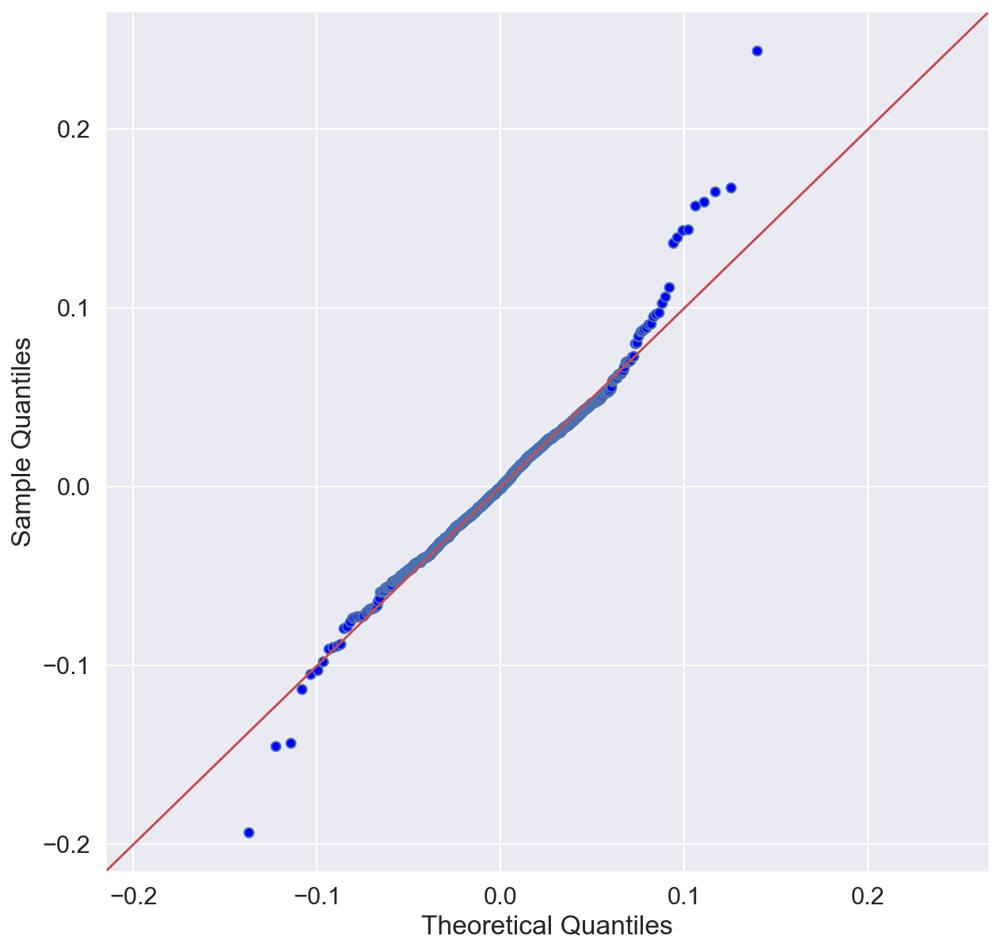

In [48]:
draw_qqplot(top_returns['TSLA'], sps.laplace)

У нашего распределения края ниже, чем у подобранного лапласовского.

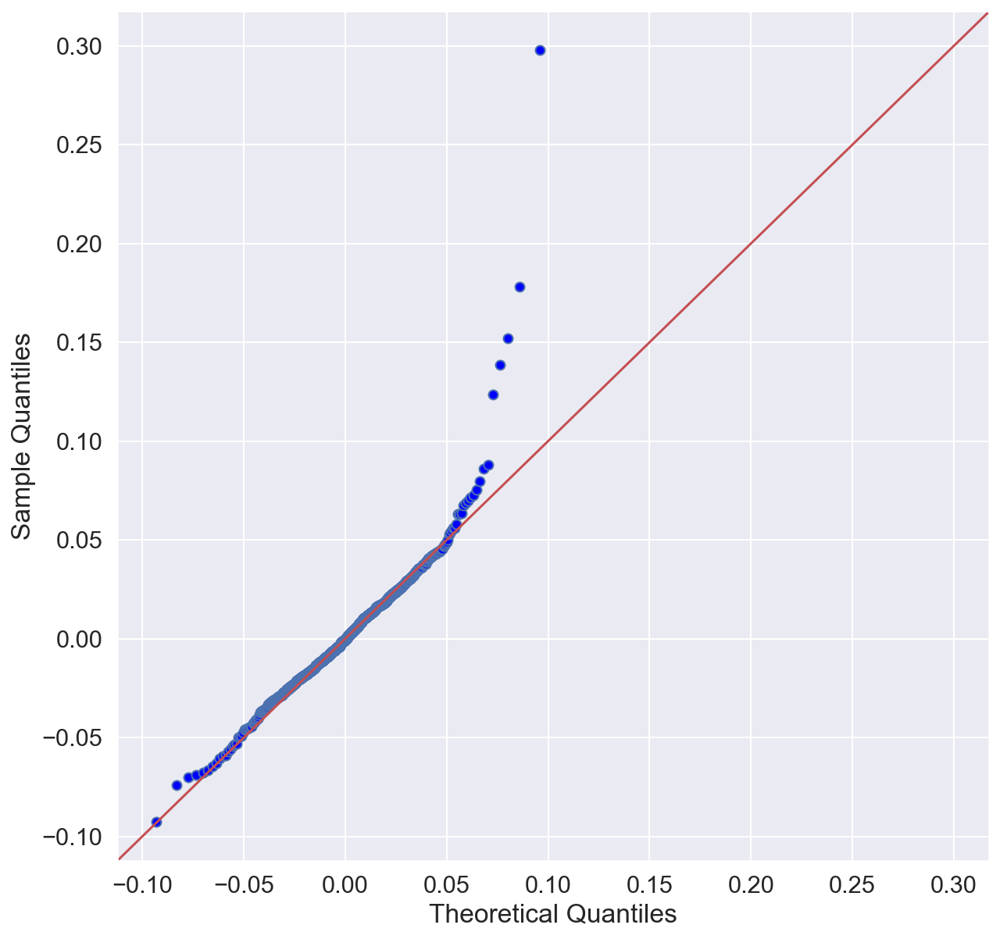

In [49]:
draw_qqplot(top_returns['NVDA'], sps.laplace)

In [50]:
top_returns_norm = top_returns.copy()
for col in top_returns.columns:
    loc, scale = sps.laplace.fit(top_returns[col])
    top_returns_norm[col] = np.clip(sps.laplace(loc, scale).cdf(top_returns[col]), 0.000001, 0.999999)
    top_returns_norm[col] = sps.norm().ppf(top_returns_norm[col])

In [51]:
sps.norm().ppf(0.999999)

4.753424308817087

In [52]:
top_returns_norm.isna().all()
top_returns_norm[top_returns_norm['CSC'] == np.inf]
# top_returns_norm[top_returns_norm['CSC'] > 0.99]

,NFLX,TSLA,NKTR,NVDA,ABMD,STZ,ALGN,AVGO,INCY,ILMN,MU,NXPI,TTWO,DXCM,REGN,MPWR,DAL,LUV,CSC,VRTX
date,,,,,,,,,,,,,,,,,,,,


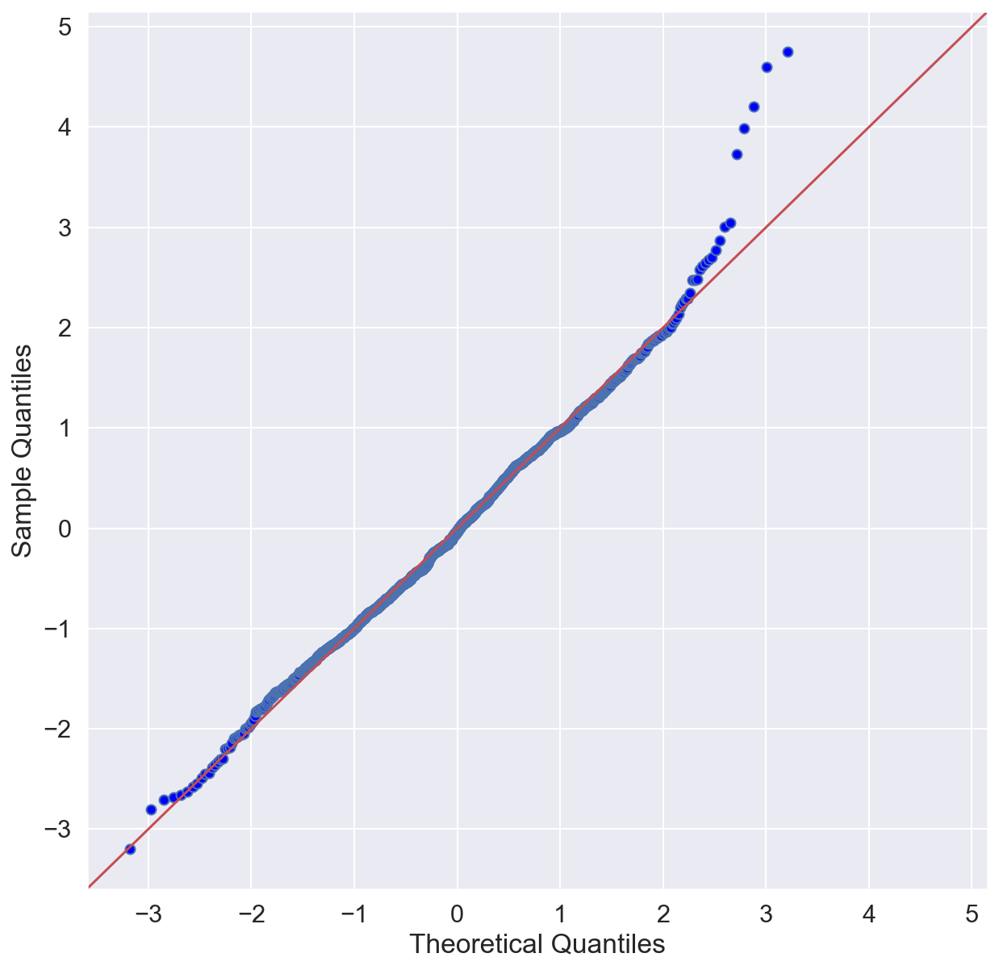

In [53]:
draw_qqplot(top_returns_norm['NVDA'], sps.norm)

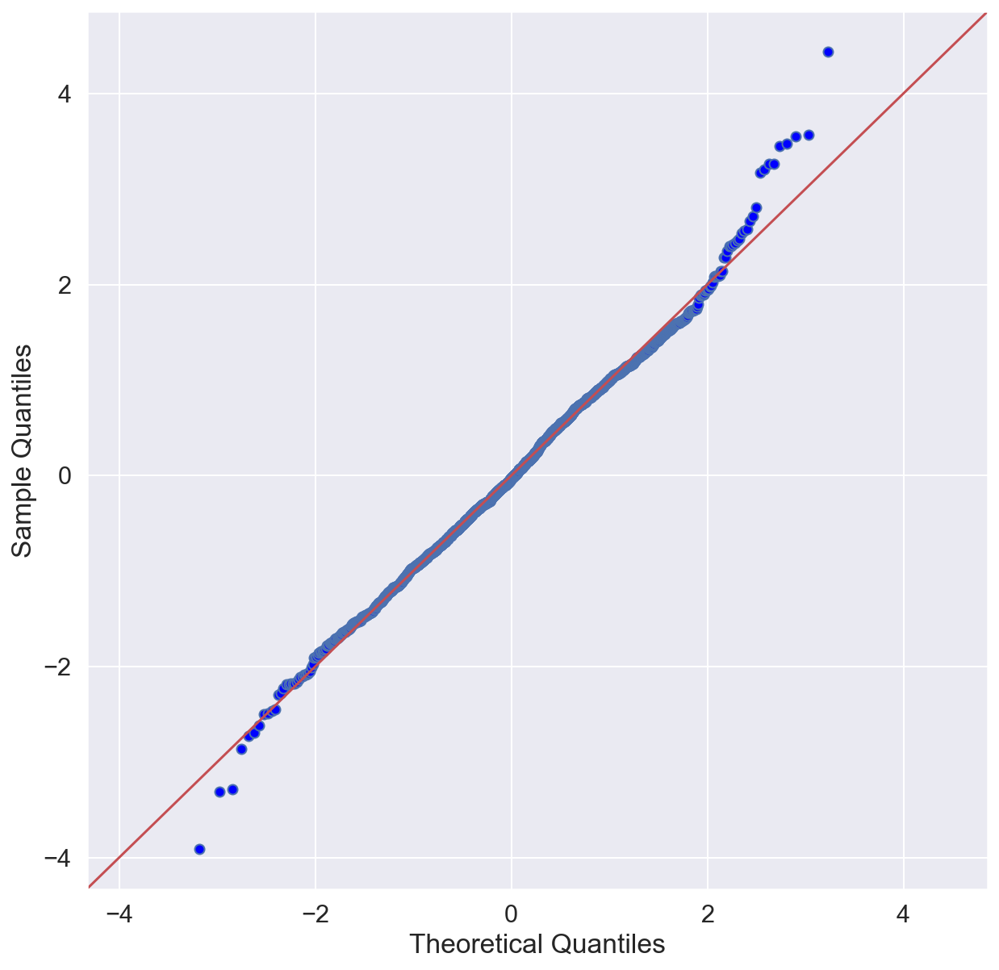

In [54]:
draw_qqplot(top_returns_norm['TSLA'], sps.norm)

In [55]:
print(top_returns_norm['CSC'].isna().any(),
    np.isnan(np.cov(top_returns_norm.T)).any())

False False


In [56]:
top_returns_norm.shape

(1500, 20)

In [57]:
Sigma = np.cov(top_returns_norm.to_numpy().T)

means = np.mean(top_returns.to_numpy(), axis=0)

w_ppca = decrease_risk(means, Sigma, R)

columns = top_returns.columns.to_numpy()
portfolio_return_to_norm = count_portfolio_return(columns, w_ppca, returns_test) 

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:15:01 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:15:01 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:15:01 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:15:01 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:15:01 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:15:01 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

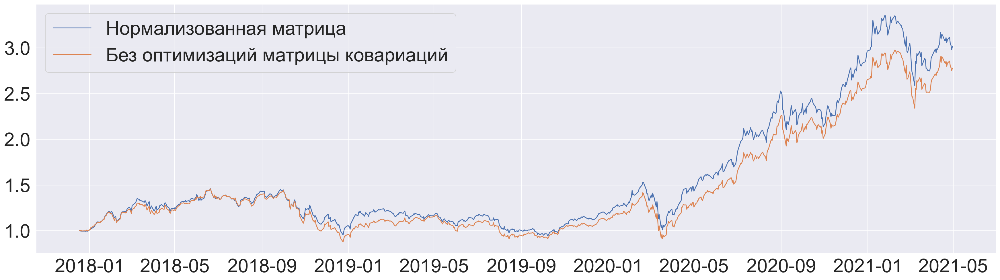

In [58]:
sns.set(style='darkgrid', font_scale=3)

plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_to_norm.index, portfolio_return_to_norm, label='Нормализованная матрица')
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.legend();

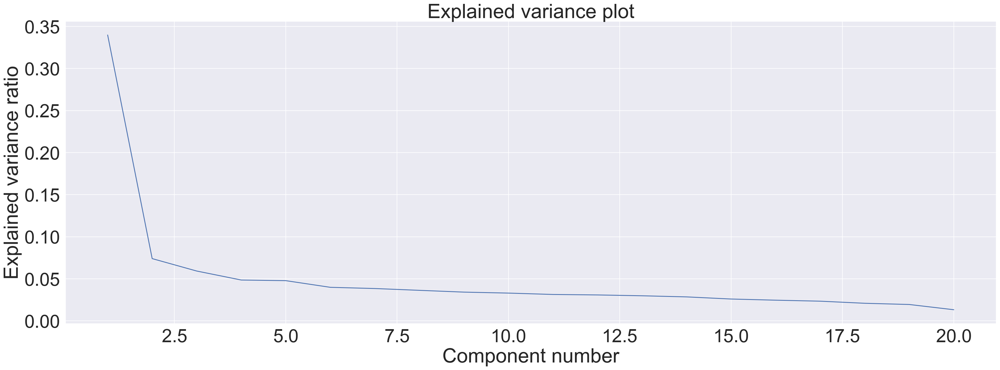

In [59]:
pca = PCA(n_components=20)
pca.fit(top_returns_norm)

fig, ax = plt.subplots(figsize=(30, 10))
ax.set_title("Explained variance plot")
ax.set_xlabel("Component number")
ax.set_ylabel("Explained variance ratio")
plt.plot(np.arange(pca.n_components) + 1, pca.explained_variance_ratio_);

In [60]:
def get_pca_test_returns(df, kept_components):
    pca = PCA(n_components=df.shape[1])
    pca.fit(df)
    transformed_top_returns = pca.transform(df)

    transformed_top_returns[:,kept_components:] = 0

    simplified_returns = pca.inverse_transform(transformed_top_returns)

    mu = np.mean(top_returns.to_numpy(), axis=0)

    R = 2e-3
    Sigma = np.cov(simplified_returns.T)

    w = decrease_risk(mu, Sigma, R)

    columns = df.columns.to_numpy()
    return count_portfolio_return(columns, w, returns_test)

In [61]:
portfolio_return_to_norm_pca_4 = get_pca_test_returns(top_returns_norm, 4)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:15:02 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:15:02 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:15:02 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:15:02 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:15:02 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:15:02 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

In [62]:
portfolio_return_to_norm_pca_12 = get_pca_test_returns(top_returns_norm, 12)
portfolio_return_to_norm_pca_8 = get_pca_test_returns(top_returns_norm, 8)
portfolio_return_to_norm_pca_3 = get_pca_test_returns(top_returns_norm, 3)
portfolio_return_to_norm_pca_2 = get_pca_test_returns(top_returns_norm, 2)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:15:02 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:15:02 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:15:02 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:15:02 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:15:02 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:15:02 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:15:02 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:15:02 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing -> SCS
(CVXPY) Mar 19 06:15:02 PM: Applying reduction Dcp2Cone
(CVXPY) Mar 19 06:15:02 PM: Applying reduction CvxAttr2Constr
(CVXPY) Mar 19 06:15:02 PM: Applying reduction ConeMatrixStuffing
(CVXPY) Mar 19 06:15:02 PM: Applying reduction SCS
(CVXPY) Mar 19 06:15:02 PM: Finished problem compilation (took 3.429e-02 seconds).
-------------------------------------------------------------------------------
                                Numerical solver                               
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:15:02 PM: Invoking solver SCS  to obtain a solution.
------------------------------------------------------------------
	       SCS v3.2.0 - Splitting Conic Solver
	(c) Brendan

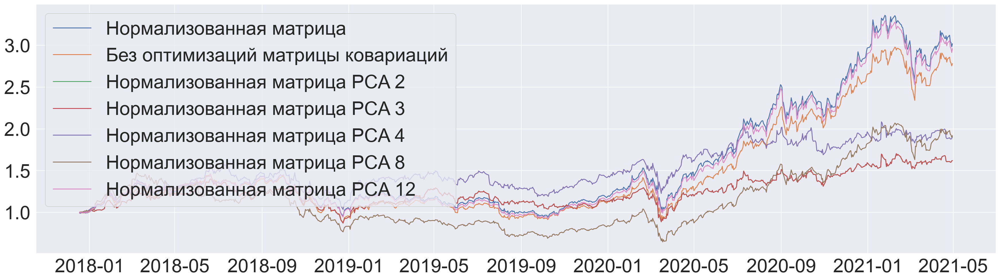

In [66]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_to_norm.index, portfolio_return_to_norm, label='Нормализованная матрица')
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(portfolio_return_to_norm_pca_4.index, portfolio_return_to_norm_pca_2, label='Нормализованная матрица PCA 2')
plt.plot(portfolio_return_to_norm_pca_4.index, portfolio_return_to_norm_pca_3, label='Нормализованная матрица PCA 3')
plt.plot(portfolio_return_to_norm_pca_4.index, portfolio_return_to_norm_pca_4, label='Нормализованная матрица PCA 4')
plt.plot(portfolio_return_to_norm_pca_4.index, portfolio_return_to_norm_pca_8, label='Нормализованная матрица PCA 8')
plt.plot(portfolio_return_to_norm_pca_4.index, portfolio_return_to_norm_pca_12, label='Нормализованная матрица PCA 12')
plt.legend(loc='upper left');

In [64]:
portfolio_return_to_norm_pca_5 = get_pca_test_returns(top_returns_norm, 5)
portfolio_return_to_norm_pca_6 = get_pca_test_returns(top_returns_norm, 6)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 06:15:03 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 06:15:03 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 06:15:03 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 06:15:03 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 06:15:03 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 06:15:03 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

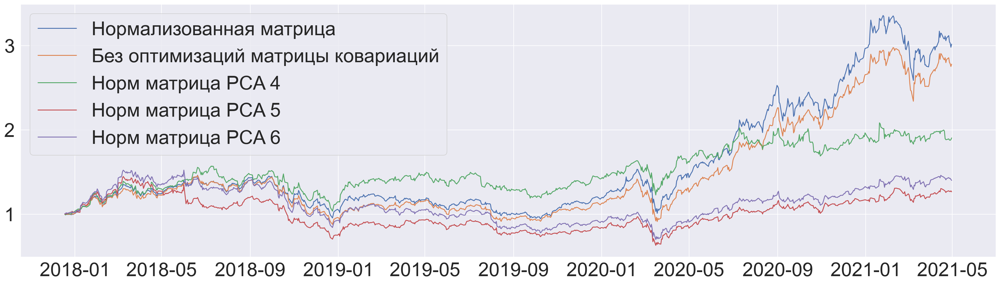

In [392]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_to_norm.index, portfolio_return_to_norm, label='Нормализованная матрица')
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(portfolio_return_to_norm_pca_4.index, portfolio_return_to_norm_pca_4, label='Норм матрица PCA 4')
plt.plot(portfolio_return_to_norm_pca_5.index, portfolio_return_to_norm_pca_5, label='Норм матрица PCA 5')
plt.plot(portfolio_return_to_norm_pca_6.index, portfolio_return_to_norm_pca_6, label='Норм матрица PCA 6')
plt.legend(loc='upper left');

In [67]:
from sklearn import preprocessing

scaler = preprocessing.StandardScaler().fit(top_returns.to_numpy())
top_returns_scaled = pd.DataFrame(scaler.transform(top_returns.to_numpy()), columns=top_returns.columns)

In [68]:
top_returns_scaled

,NFLX,TSLA,NKTR,NVDA,ABMD,STZ,ALGN,AVGO,INCY,ILMN,MU,NXPI,TTWO,DXCM,REGN,MPWR,DAL,LUV,CSC,VRTX
0,1.225531,-0.619472,0.799130,0.511343,-0.501514,0.059342,0.342660,0.060260,-0.100215,1.503422,2.677345,1.717604,1.508140,0.442887,0.684650,0.382778,-0.375366,-1.106834,1.641227,-0.900953
1,3.402538,-0.500737,-0.467472,0.432491,-0.347929,-0.838801,0.796305,-0.930809,-0.520520,-0.423651,1.227992,0.357922,-0.077391,-0.967819,0.966433,-1.299313,-0.256160,1.222823,-0.136480,-0.070711
2,-0.512783,-0.766223,0.349485,1.549878,0.249669,-1.940741,-0.491811,-0.018528,1.447164,0.022426,0.840210,0.804407,2.172975,-1.147525,2.171889,1.156550,1.851088,0.049512,-0.438121,0.786203
3,2.619788,-0.322919,-0.213921,-0.621945,-0.327857,-0.284817,-0.986045,-0.396348,1.768320,0.264678,0.146275,0.970377,0.248260,-0.418695,3.246257,-0.085150,-0.132880,-0.765290,-1.666167,0.772117
4,4.142078,0.344160,0.091067,-0.093186,0.069511,0.855135,-2.082144,3.245527,-0.106882,-0.002522,0.402442,1.910716,0.407786,-0.016788,-0.261977,1.342627,-0.308519,0.389248,-0.410378,1.347090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,-0.452610,1.361869,0.609188,0.666130,0.321411,0.244601,-0.993521,-0.078680,0.173951,-0.683822,-0.232091,0.135153,0.557347,-1.850105,-0.006949,0.439338,0.744336,-0.098456,-0.075230,-0.434124
1496,-0.156631,1.136503,-0.241695,-0.993098,-0.161908,0.060793,0.058247,-0.323924,-0.686718,-0.324834,-1.051085,-0.143593,-0.346443,-0.792747,-0.022310,-0.595388,-0.737990,0.012370,-0.075230,-0.201572
1497,0.274765,-0.261417,0.874703,-1.211715,-0.047679,-0.440117,0.164889,0.549689,0.882565,0.280372,0.107514,0.086122,-0.024159,0.730908,0.473718,-0.715619,-0.064926,-0.355698,-0.075230,0.758335
1498,0.200775,-0.179484,-0.876447,-0.021645,-0.936485,0.920032,-0.434956,-0.593305,-0.776117,-0.721162,0.106729,-0.135815,0.489830,-0.228776,-0.447975,-0.689356,1.377627,0.566687,-0.075230,-0.499027


In [80]:
portfolio_return_scaled_pca_12 = get_pca_test_returns(top_returns_scaled, 12)
portfolio_return_scaled_pca_8 = get_pca_test_returns(top_returns_scaled, 8)
portfolio_return_scaled_pca_5 = get_pca_test_returns(top_returns_scaled, 5)
portfolio_return_scaled_pca_4 = get_pca_test_returns(top_returns_scaled, 4)
portfolio_return_scaled_pca_3 = get_pca_test_returns(top_returns_scaled, 3)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 19 07:12:18 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 19 07:12:18 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 19 07:12:18 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 19 07:12:18 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 19 07:12:18 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 07:12:18 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

-------------------------------------------------------------------------------
(CVXPY) Mar 19 07:12:18 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 19 07:12:18 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing -> SCS
(CVXPY) Mar 19 07:12:18 PM: Applying reduction Dcp2Cone
(CVXPY) Mar 19 07:12:18 PM: Applying reduction CvxAttr2Constr
(CVXPY) Mar 19 07:12:18 PM: Applying reduction ConeMatrixStuffing
(CVXPY) Mar 19 07:12:18 PM: Applying reduction SCS
(CVXPY) Mar 19 07:12:18 PM: Finished problem compilation (took 3.800e-02 seconds).
-------------------------------------------------------------------------------
                                Numerical solver                               
-------------------------------------------------------------------------------
(CVXPY) Mar 19 07:12:18 PM: Invoking solver SCS  to obtain a solution.
------------------------------------------------------------------
	       SCS v3.2.0 - Splitting Conic Solver
	(c) Brendan

------------------------------------------------------------------
 iter | pri res | dua res |   gap   |   obj   |  scale  | time (s)
------------------------------------------------------------------
     0| 3.43e+01  2.80e+00  9.32e+01 -4.66e+01  1.00e-01  1.42e-03 
   125| 1.67e-05  4.98e-06  2.17e-06  7.46e-02  4.63e-01  3.47e-03 
------------------------------------------------------------------
status:  solved
timings: total: 6.14e-03s = setup: 2.64e-03s + solve: 3.50e-03s
	 lin-sys: 1.02e-04s, cones: 3.13e-05s, accel: 7.79e-06s
------------------------------------------------------------------
objective = 0.074605
------------------------------------------------------------------
-------------------------------------------------------------------------------
                                    Summary                                    
-------------------------------------------------------------------------------
(CVXPY) Mar 19 07:12:18 PM: Problem status: optimal
(CVXPY) Mar 

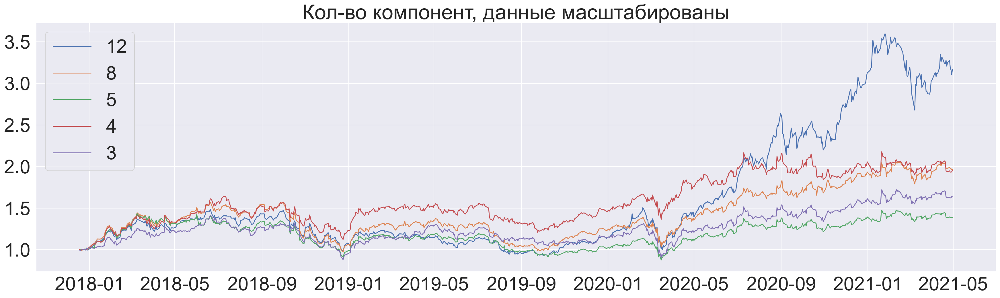

In [83]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_scaled_pca_12.index, portfolio_return_scaled_pca_12, label='12')
plt.plot(portfolio_return_scaled_pca_8.index, portfolio_return_scaled_pca_8, label='8')
plt.plot(portfolio_return_scaled_pca_5.index, portfolio_return_scaled_pca_5, label='5')
plt.plot(portfolio_return_scaled_pca_4.index, portfolio_return_scaled_pca_4, label='4')
plt.plot(portfolio_return_scaled_pca_3.index, portfolio_return_scaled_pca_3, label='3')
plt.title('Кол-во компонент, данные масштабированы')
plt.legend(loc='upper left');

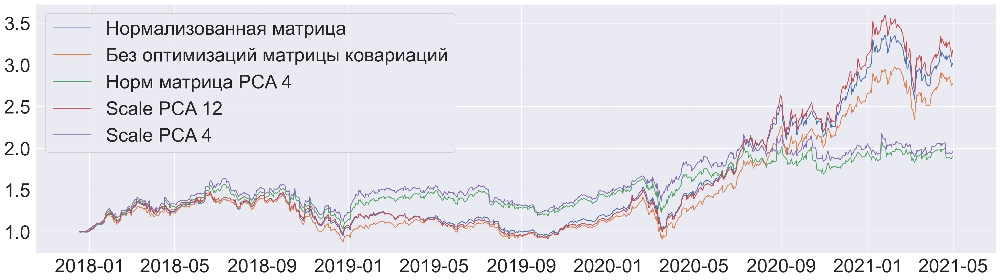

In [85]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_to_norm.index, portfolio_return_to_norm, label='Нормализованная матрица')
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(portfolio_return_to_norm_pca_4.index, portfolio_return_to_norm_pca_4, label='Норм матрица PCA 4')
plt.plot(portfolio_return_scaled_pca_12.index, portfolio_return_scaled_pca_12, label='Scale PCA 12')
plt.plot(portfolio_return_scaled_pca_4.index, portfolio_return_scaled_pca_4, label='Scale PCA 4')

plt.legend(loc='upper left');

In [89]:
import mppca

n_classes = 4
latent_dim = 5

pi = np.random.rand(n_classes)
mu = np.random.rand(n_classes, top_returns.shape[1])
W = np.random.rand(n_classes, top_returns.shape[1], latent_dim)
sigma2 = np.random.rand(n_classes)

n_iter = 100

pi, mu, W, sigma2, R, L, sigma2hist = mppca.mppca_gem(
        top_returns.to_numpy(), pi, mu, W, sigma2, n_iter)

# top_returns_mppca = 
W

....................................................................................................

array([[[ 7.66917646e-02, -5.32974917e-03,  6.56195077e-03,
          6.66831891e-03,  1.10677422e-02],
        [ 4.67869462e-03,  5.02889145e-03,  4.10338439e-03,
         -1.32673934e-03,  2.75270433e-03],
        [-9.60339061e-03,  2.32574724e-02,  1.72610073e-02,
          6.10685762e-02, -1.04364773e-02],
        [-4.37356617e-04,  1.71951225e-03,  3.52217951e-03,
          4.72616111e-03,  7.24661564e-03],
        [ 2.67446091e-03,  7.12753147e-03, -2.51800222e-03,
          9.75641087e-05,  3.84618563e-03],
        [ 1.35315533e-03,  3.69670186e-03,  6.56621923e-04,
          1.38449220e-03,  2.41224709e-03],
        [-8.80761582e-04,  4.83413992e-03,  3.28425585e-03,
         -6.43008925e-04,  3.86640961e-03],
        [-2.46875331e-03,  1.24627880e-03,  3.20109159e-03,
          1.51008378e-03,  9.37666801e-03],
        [-2.04825584e-03,  5.29127478e-03, -2.10628002e-05,
          2.03733436e-03,  4.35162785e-03],
        [-3.13534523e-03,  5.62363160e-03,  3.88319523e-03,
    

In [92]:
R.shape

(1500, 4)

In [93]:
W.shape

(4, 20, 5)

In [95]:
sigma2

array([0.00023323, 0.0014017 , 0.00032606, 0.00013094])

In [90]:
L

array([-22927.71708256,  69887.01046636,  73424.1365002 ,  74315.35753408,
        74700.75324593,  75021.97944968,  75290.93660824,  75522.29080762,
        75708.96313897,  75854.00549497,  75975.82557537,  76088.19041224,
        76181.49670865,  76246.95723005,  76296.30178716,  76335.80356317,
        76367.18812169,  76391.18887744,  76409.84736551,  76424.62563181,
        76436.35355022,  76446.18037161,  76455.95736609,  76466.97444121,
        76477.14490267,  76486.3032368 ,  76494.02771781,  76500.29671563,
        76505.63556047,  76510.43724268,  76515.38092131,  76520.73593147,
        76525.72995636,  76529.65574179,  76532.44191483,  76534.50119074,
        76536.11899434,  76537.45835402,  76538.633486  ,  76539.77449022,
        76541.09464085,  76542.57289262,  76543.68594063,  76544.47495378,
        76545.10127381,  76545.63194592,  76546.1052322 ,  76546.55842872,
        76547.05493109,  76547.70374944,  76548.49119969,  76549.1670659 ,
        76549.74699523,  

In [94]:
mu.shape

(4, 20)

In [110]:
errors = np.zeros((n_classes, top_returns.shape[0]))
for i in range(n_classes):
    transformed = mppca.transform(top_returns.to_numpy(), W[i], mu[i].reshape(1, top_returns.shape[1]),
                                sigma2[i])
    errors[i] = np.mean((top_returns.to_numpy() - transformed)**2, axis=1)

In [113]:
best_components = np.argmin(errors.T, axis=1)

In [118]:
mppca_top_returns = np.zeros(top_returns.shape)
for i in range(mppca_top_returns.shape[0]):
    mppca_top_returns[i] = mppca.transform(top_returns.to_numpy()[i], W[best_components[i]], 
                                           mu[best_components[i]].reshape(1, top_returns.shape[1]),
                                           sigma2[best_components[i]])
                                       

In [119]:
mppca_top_returns

array([[ 0.03746493,  0.01288598,  0.02946752, ...,  0.00818276,
         0.00592499,  0.01109218],
       [ 0.11056241,  0.00715913, -0.01515328, ...,  0.00377106,
        -0.00185084,  0.00539893],
       [-0.00638355, -0.02963924,  0.01070332, ...,  0.01068274,
         0.00513391,  0.03834917],
       ...,
       [ 0.0103322 , -0.00485428,  0.01974617, ..., -0.00207287,
         0.00155497,  0.02108885],
       [ 0.00582756, -0.00248997, -0.01440684, ...,  0.0193595 ,
        -0.00217276, -0.01409646],
       [ 0.00408552,  0.00585516,  0.0364627 , ...,  0.00375616,
         0.0021926 ,  0.00270807]])

In [124]:
np.mean(mppca_top_returns - top_returns.to_numpy()**2)

0.001079402625823319

In [133]:
R = 2e-3
mppca_4_5_ret = get_test_returns(mppca_top_returns)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 22 02:06:06 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 22 02:06:06 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 22 02:06:06 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 22 02:06:06 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 22 02:06:06 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 22 02:06:06 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

In [125]:
transformed_top_returns = pca.transform(top_returns)

kept_components = 5
transformed_top_returns[:,kept_components:] = 0

simplified_returns = pca.inverse_transform(transformed_top_returns)

In [134]:
from sklearn.metrics import mean_absolute_error
print(mean_absolute_error(simplified_returns, top_returns.to_numpy()))
print(mean_absolute_error(mppca_top_returns, top_returns.to_numpy()))

0.011334360834897025
0.009168728578591984


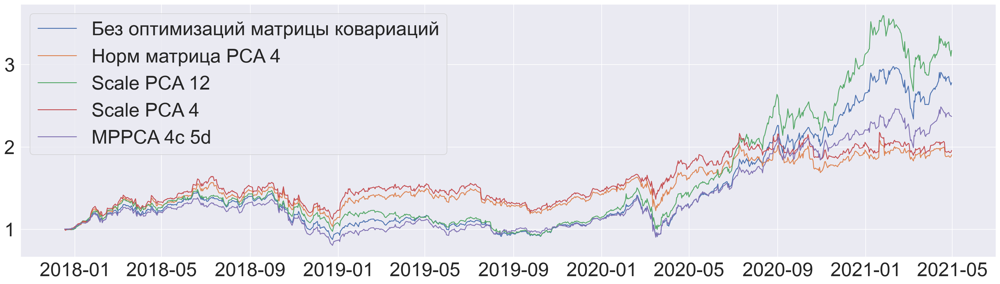

In [135]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(portfolio_return_to_norm_pca_4.index, portfolio_return_to_norm_pca_4, label='Норм матрица PCA 4')
plt.plot(portfolio_return_scaled_pca_12.index, portfolio_return_scaled_pca_12, label='Scale PCA 12')
plt.plot(portfolio_return_scaled_pca_4.index, portfolio_return_scaled_pca_4, label='Scale PCA 4')
plt.plot(mppca_4_5_ret.index, mppca_4_5_ret, label='MPPCA 4c 5d')

plt.legend(loc='upper left');

In [143]:
def get_mppca_test_returns(data, n_classes, latent_dim, n_iter=100):
    pi = np.random.rand(n_classes)
    mu = np.random.rand(n_classes, data.shape[1])
    W = np.random.rand(n_classes, data.shape[1], latent_dim)
    sigma2 = np.random.rand(n_classes)

    pi, mu, W, sigma2, R, L, sigma2hist = mppca.mppca_gem(
            data, pi, mu, W, sigma2, n_iter)
    
    errors = np.zeros((n_classes, data.shape[0]))
    for i in range(n_classes):
        transformed = mppca.transform(
            data, W[i], mu[i].reshape(1, data.shape[1]),
            sigma2[i])
        errors[i] = np.mean((data - transformed)**2, axis=1)
    
    best_components = np.argmin(errors.T, axis=1)
    
    mppca_data = np.zeros(data.shape)
    for i in range(mppca_data.shape[0]):
        mppca_data[i] = mppca.transform(data[i], W[best_components[i]], 
                                               mu[best_components[i]].reshape(1, data.shape[1]),
                                               sigma2[best_components[i]])
        
    R = 2e-3
    mppca_ret = get_test_returns(mppca_data)
    return mppca_ret

In [144]:
mppca_3_4_ret = get_mppca_test_returns(top_returns.to_numpy(), 3, 4)
mppca_3_6_ret = get_mppca_test_returns(top_returns.to_numpy(), 3, 6)
mppca_3_8_ret = get_mppca_test_returns(top_returns.to_numpy(), 3, 8)
mppca_5_4_ret = get_mppca_test_returns(top_returns.to_numpy(), 5, 4)
mppca_5_6_ret = get_mppca_test_returns(top_returns.to_numpy(), 5, 6)
mppca_5_8_ret = get_mppca_test_returns(top_returns.to_numpy(), 5, 8)

....................................................................................................===============================================================================
                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 22 03:01:46 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 22 03:01:46 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 22 03:01:46 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 22 03:01:46 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
---------------------------------------------------------------

(CVXPY) Mar 22 03:01:48 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 22 03:01:48 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 22 03:01:48 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing -> SCS
(CVXPY) Mar 22 03:01:48 PM: Applying reduction Dcp2Cone
(CVXPY) Mar 22 03:01:48 PM: Applying reduction CvxAttr2Constr
(CVXPY) Mar 22 03:01:48 PM: Applying reduction ConeMatrixStuffing
(CVXPY) Mar 22 03:01:48 PM: Applying reduction SCS
(CVXPY) Mar 22 03:01:48 PM: Finished problem compilation (took 3.873e-02 seconds).
-------------------------------------------------------------------------------
                                Numerical solver                 

(CVXPY) Mar 22 03:01:50 PM: Applying reduction SCS
(CVXPY) Mar 22 03:01:50 PM: Finished problem compilation (took 3.997e-02 seconds).
-------------------------------------------------------------------------------
                                Numerical solver                               
-------------------------------------------------------------------------------
(CVXPY) Mar 22 03:01:50 PM: Invoking solver SCS  to obtain a solution.
------------------------------------------------------------------
	       SCS v3.2.0 - Splitting Conic Solver
	(c) Brendan O'Donoghue, Stanford University, 2012
------------------------------------------------------------------
problem:  variables n: 21, constraints m: 44
cones: 	  z: primal zero / dual free vars: 2
	  l: linear vars: 20
	  q: soc vars: 22, qsize: 1
settings: eps_abs: 1.0e-05, eps_rel: 1.0e-05, eps_infeas: 1.0e-07
	  alpha: 1.50, scale: 1.00e-01, adaptive_scale: 1
	  max_iters: 100000, normalize: 1, rho_x: 1.00e-06
	  acceleration_

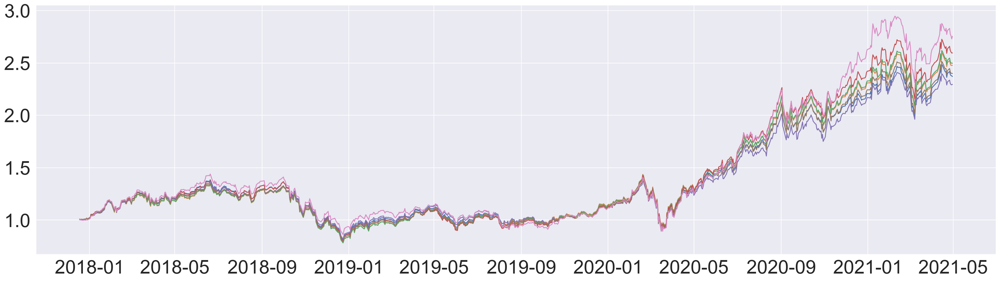

In [146]:
plt.figure(figsize=(30, 8))
plt.plot(mppca_4_5_ret.index, mppca_4_5_ret, label='MPPCA 4c 5d')
plt.plot(mppca_3_4_ret.index, mppca_3_4_ret, label='MPPCA 3c 4d')
plt.plot(mppca_3_6_ret.index, mppca_3_6_ret, label='MPPCA 3c 6d')
plt.plot(mppca_3_8_ret.index, mppca_3_8_ret, label='MPPCA 3c 8d')
plt.plot(mppca_5_4_ret.index, mppca_5_4_ret, label='MPPCA 5c 4d')
plt.plot(mppca_5_6_ret.index, mppca_5_6_ret, label='MPPCA 5c 6d')
plt.plot(mppca_5_8_ret.index, mppca_5_8_ret, label='MPPCA 5c 8d')
# plt.legend(loc='upper left');

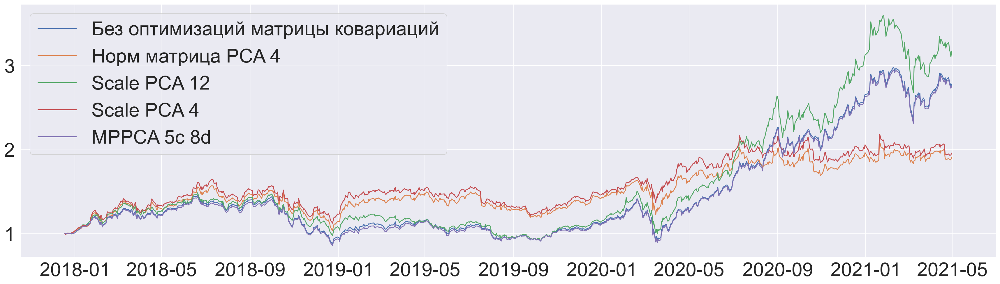

In [147]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(portfolio_return_to_norm_pca_4.index, portfolio_return_to_norm_pca_4, label='Норм матрица PCA 4')
plt.plot(portfolio_return_scaled_pca_12.index, portfolio_return_scaled_pca_12, label='Scale PCA 12')
plt.plot(portfolio_return_scaled_pca_4.index, portfolio_return_scaled_pca_4, label='Scale PCA 4')
plt.plot(mppca_4_5_ret.index, mppca_5_8_ret, label='MPPCA 5c 8d')

plt.legend(loc='upper left');

In [149]:
mppca_5_10_ret = get_mppca_test_returns(top_returns.to_numpy(), 5, 10)
# mppca_5_12_ret = get_mppca_test_returns(top_returns.to_numpy(), 5, 12)
mppca_6_8_ret = get_mppca_test_returns(top_returns.to_numpy(), 6, 8)
mppca_6_10_ret = get_mppca_test_returns(top_returns.to_numpy(), 6, 10)
mppca_6_12_ret = get_mppca_test_returns(top_returns.to_numpy(), 6, 12)

....................................................................................................===============================================================================
                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 22 03:06:17 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 22 03:06:17 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 22 03:06:17 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 22 03:06:17 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
---------------------------------------------------------------

(CVXPY) Mar 22 03:06:19 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 22 03:06:19 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 22 03:06:19 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing -> SCS
(CVXPY) Mar 22 03:06:19 PM: Applying reduction Dcp2Cone
(CVXPY) Mar 22 03:06:19 PM: Applying reduction CvxAttr2Constr
(CVXPY) Mar 22 03:06:19 PM: Applying reduction ConeMatrixStuffing
(CVXPY) Mar 22 03:06:19 PM: Applying reduction SCS
(CVXPY) Mar 22 03:06:20 PM: Finished problem compilation (took 3.644e-02 seconds).
-------------------------------------------------------------------------------
                                Numerical solver                 

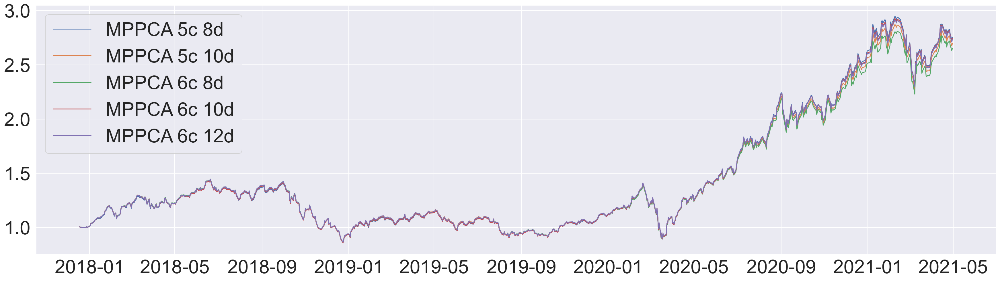

In [151]:
plt.figure(figsize=(30, 8))
plt.plot(mppca_5_8_ret.index, mppca_5_8_ret, label='MPPCA 5c 8d')
plt.plot(mppca_5_10_ret.index, mppca_5_10_ret, label='MPPCA 5c 10d')
plt.plot(mppca_6_8_ret.index, mppca_6_8_ret, label='MPPCA 6c 8d')
plt.plot(mppca_6_10_ret.index, mppca_6_10_ret, label='MPPCA 6c 10d')
plt.plot(mppca_6_12_ret.index, mppca_6_12_ret, label='MPPCA 6c 12d')
plt.legend(loc='upper left');

In [152]:
mppca_3_3_ret = get_mppca_test_returns(top_returns.to_numpy(), 3, 3)
mppca_2_3_ret = get_mppca_test_returns(top_returns.to_numpy(), 2, 3)
mppca_2_4_ret = get_mppca_test_returns(top_returns.to_numpy(), 2, 4)
mppca_2_5_ret = get_mppca_test_returns(top_returns.to_numpy(), 2, 5)

....................................................................................................===============================================================================
                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 22 03:33:54 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 22 03:33:54 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 22 03:33:54 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 22 03:33:54 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
---------------------------------------------------------------

(CVXPY) Mar 22 03:33:56 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 22 03:33:56 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 22 03:33:56 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing -> SCS
(CVXPY) Mar 22 03:33:56 PM: Applying reduction Dcp2Cone
(CVXPY) Mar 22 03:33:56 PM: Applying reduction CvxAttr2Constr
(CVXPY) Mar 22 03:33:56 PM: Applying reduction ConeMatrixStuffing
(CVXPY) Mar 22 03:33:56 PM: Applying reduction SCS
(CVXPY) Mar 22 03:33:56 PM: Finished problem compilation (took 4.023e-02 seconds).
-------------------------------------------------------------------------------
                                Numerical solver                 

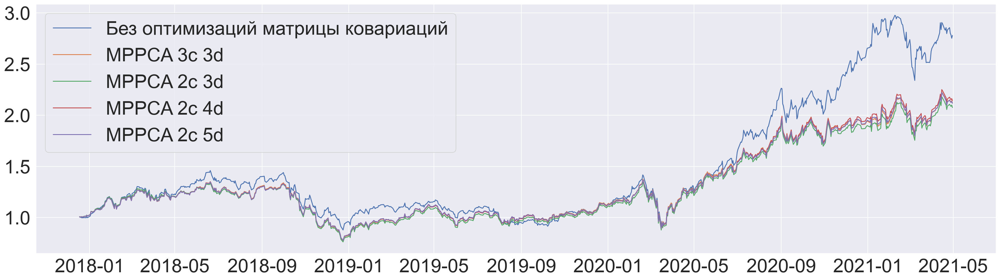

In [156]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(mppca_3_3_ret.index, mppca_3_3_ret, label='MPPCA 3c 3d')
plt.plot(mppca_2_3_ret.index, mppca_2_3_ret, label='MPPCA 2c 3d')
plt.plot(mppca_2_4_ret.index, mppca_2_4_ret, label='MPPCA 2c 4d')
plt.plot(mppca_2_5_ret.index, mppca_2_5_ret, label='MPPCA 2c 5d')
plt.legend(loc='upper left');

In [157]:
mppca_2_6_ret = get_mppca_test_returns(top_returns.to_numpy(), 2, 6)
mppca_2_8_ret = get_mppca_test_returns(top_returns.to_numpy(), 2, 8)

....................................................................................................===============================================================================
                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 22 03:45:53 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 22 03:45:53 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 22 03:45:53 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 22 03:45:53 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
---------------------------------------------------------------

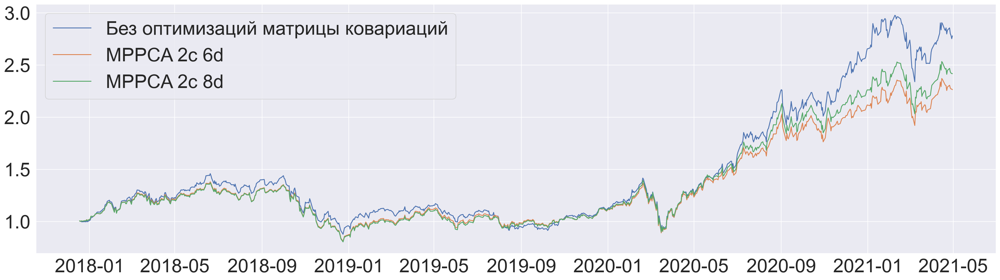

In [158]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(mppca_2_6_ret.index, mppca_2_6_ret, label='MPPCA 2c 6d')
plt.plot(mppca_2_8_ret.index, mppca_2_8_ret, label='MPPCA 2c 8d')
plt.legend(loc='upper left');

К нормированным данным!

In [162]:
# mppca_scaled_3_4_ret = get_mppca_test_returns(top_returns_scaled.to_numpy(), 3, 4)
mppca_scaled_3_6_ret = get_mppca_test_returns(top_returns_scaled.to_numpy(), 3, 6)
# mppca_scaled_3_8_ret = get_mppca_test_returns(top_returns_scaled.to_numpy(), 3, 8)
mppca_scaled_5_4_ret = get_mppca_test_returns(top_returns_scaled.to_numpy(), 5, 4)
mppca_scaled_5_6_ret = get_mppca_test_returns(top_returns_scaled.to_numpy(), 5, 6)
mppca_scaled_5_8_ret = get_mppca_test_returns(top_returns_scaled.to_numpy(), 5, 8)

....................................................................................................===============================================================================
                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 23 02:02:53 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 23 02:02:53 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 23 02:02:53 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 23 02:02:53 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
---------------------------------------------------------------

(CVXPY) Mar 23 02:02:55 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 23 02:02:55 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 23 02:02:55 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing -> SCS
(CVXPY) Mar 23 02:02:55 PM: Applying reduction Dcp2Cone
(CVXPY) Mar 23 02:02:55 PM: Applying reduction CvxAttr2Constr
(CVXPY) Mar 23 02:02:55 PM: Applying reduction ConeMatrixStuffing
(CVXPY) Mar 23 02:02:55 PM: Applying reduction SCS
(CVXPY) Mar 23 02:02:55 PM: Finished problem compilation (took 3.798e-02 seconds).
-------------------------------------------------------------------------------
                                Numerical solver                 

In [164]:
mppca_scaled_3_3_ret = get_mppca_test_returns(top_returns_scaled.to_numpy(), 3, 3)
mppca_scaled_2_3_ret = get_mppca_test_returns(top_returns_scaled.to_numpy(), 2, 3)
# mppca_scaled_2_4_ret = get_mppca_test_returns(top_returns_scaled.to_numpy(), 2, 4)
mppca_scaled_2_5_ret = get_mppca_test_returns(top_returns_scaled.to_numpy(), 2, 5)

....................................................................................................===============================================================================
                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 23 02:04:04 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 23 02:04:04 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 23 02:04:04 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 23 02:04:04 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
---------------------------------------------------------------

(CVXPY) Mar 23 02:04:06 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 23 02:04:06 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 23 02:04:06 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing -> SCS
(CVXPY) Mar 23 02:04:06 PM: Applying reduction Dcp2Cone
(CVXPY) Mar 23 02:04:06 PM: Applying reduction CvxAttr2Constr
(CVXPY) Mar 23 02:04:06 PM: Applying reduction ConeMatrixStuffing
(CVXPY) Mar 23 02:04:06 PM: Applying reduction SCS
(CVXPY) Mar 23 02:04:06 PM: Finished problem compilation (took 3.771e-02 seconds).
-------------------------------------------------------------------------------
                                Numerical solver                 

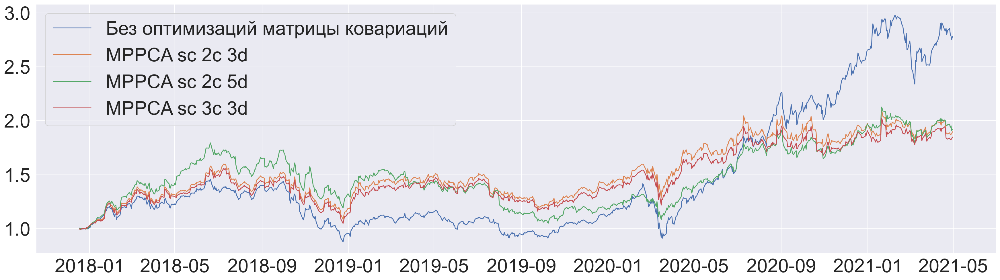

In [167]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(mppca_2_6_ret.index, mppca_scaled_2_3_ret, label='MPPCA sc 2c 3d')
plt.plot(mppca_2_8_ret.index, mppca_scaled_2_5_ret, label='MPPCA sc 2c 5d')
plt.plot(mppca_2_8_ret.index, mppca_scaled_3_3_ret, label='MPPCA sc 3c 3d')
plt.legend(loc='upper left');

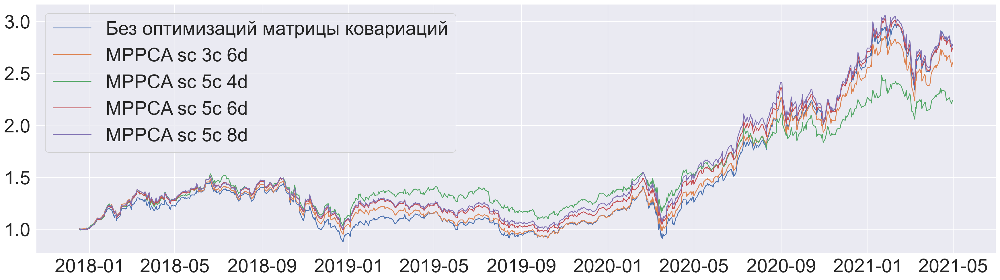

In [168]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(mppca_2_8_ret.index, mppca_scaled_3_6_ret, label='MPPCA sc 3c 6d')
plt.plot(mppca_2_8_ret.index, mppca_scaled_5_4_ret, label='MPPCA sc 5c 4d')
plt.plot(mppca_2_8_ret.index, mppca_scaled_5_6_ret, label='MPPCA sc 5c 6d')
plt.plot(mppca_2_8_ret.index, mppca_scaled_5_8_ret, label='MPPCA sc 5c 8d')
plt.legend(loc='upper left');

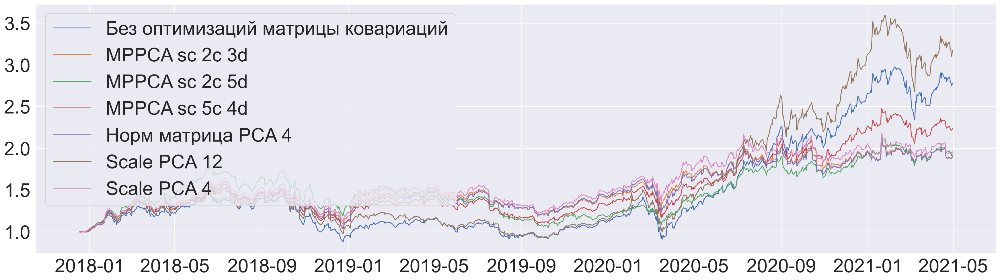

In [172]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(mppca_2_6_ret.index, mppca_scaled_2_3_ret, label='MPPCA sc 2c 3d')
plt.plot(mppca_2_8_ret.index, mppca_scaled_2_5_ret, label='MPPCA sc 2c 5d')
plt.plot(mppca_2_8_ret.index, mppca_scaled_5_4_ret, label='MPPCA sc 5c 4d')
plt.plot(portfolio_return_to_norm_pca_4.index, portfolio_return_to_norm_pca_4, label='Норм матрица PCA 4')
plt.plot(portfolio_return_scaled_pca_12.index, portfolio_return_scaled_pca_12, label='Scale PCA 12')
plt.plot(portfolio_return_scaled_pca_4.index, portfolio_return_scaled_pca_4, label='Scale PCA 4')
plt.legend(loc='upper left');

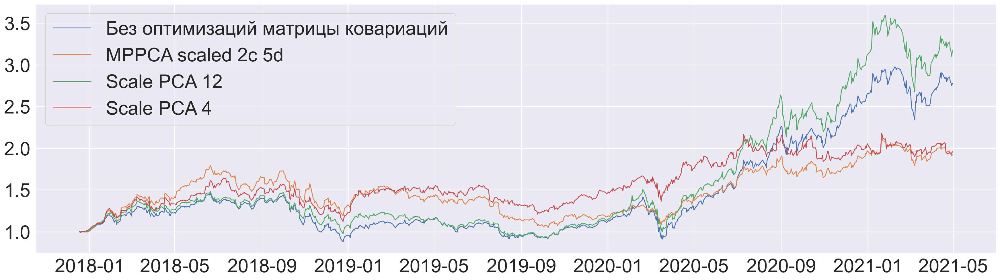

In [175]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(mppca_2_8_ret.index, mppca_scaled_2_5_ret, label='MPPCA scaled 2c 5d')
plt.plot(portfolio_return_scaled_pca_12.index, portfolio_return_scaled_pca_12, label='Scale PCA 12')
plt.plot(portfolio_return_scaled_pca_4.index, portfolio_return_scaled_pca_4, label='Scale PCA 4')
plt.legend(loc='upper left');

In [176]:
mppca_scaled_2_4_ret = get_mppca_test_returns(top_returns_scaled.to_numpy(), 2, 4)

....................................................................................................===============================================================================
                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 23 03:43:01 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 23 03:43:01 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 23 03:43:01 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 23 03:43:01 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
---------------------------------------------------------------

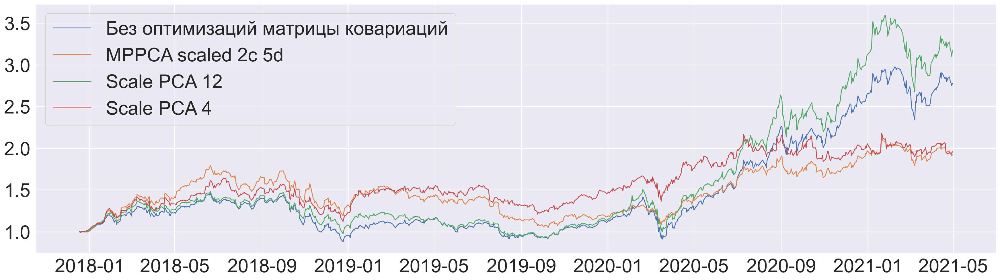

In [178]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(mppca_2_8_ret.index, mppca_scaled_2_5_ret, label='MPPCA scaled 2c 5d')
plt.plot(portfolio_return_scaled_pca_12.index, portfolio_return_scaled_pca_12, label='Scale PCA 12')
plt.plot(portfolio_return_scaled_pca_4.index, portfolio_return_scaled_pca_4, label='Scale PCA 4')
plt.legend(loc='upper left');

In [180]:
from sklearn import preprocessing

scaler = preprocessing.StandardScaler().fit(top_returns_norm.to_numpy())
top_returns_norm_scaled = pd.DataFrame(scaler.transform(top_returns_norm.to_numpy()), columns=top_returns_norm.columns)

In [195]:
scaled_norm_pca_3_ret = get_pca_test_returns(top_returns_norm_scaled, 3)
scaled_norm_pca_4_ret = get_pca_test_returns(top_returns_norm_scaled, 4)
scaled_norm_pca_5_ret = get_pca_test_returns(top_returns_norm_scaled, 5)
scaled_norm_pca_6_ret = get_pca_test_returns(top_returns_norm_scaled, 6)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 23 05:23:06 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 23 05:23:06 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 23 05:23:06 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 23 05:23:06 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 23 05:23:06 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 23 05:23:06 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

(CVXPY) Mar 23 05:23:06 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing -> SCS
(CVXPY) Mar 23 05:23:06 PM: Applying reduction Dcp2Cone
(CVXPY) Mar 23 05:23:06 PM: Applying reduction CvxAttr2Constr
(CVXPY) Mar 23 05:23:06 PM: Applying reduction ConeMatrixStuffing
(CVXPY) Mar 23 05:23:06 PM: Applying reduction SCS
(CVXPY) Mar 23 05:23:06 PM: Finished problem compilation (took 4.112e-02 seconds).
-------------------------------------------------------------------------------
                                Numerical solver                               
-------------------------------------------------------------------------------
(CVXPY) Mar 23 05:23:06 PM: Invoking solver SCS  to obtain a solution.
------------------------------------------------------------------
	       SCS v3.2.0 - Splitting Conic Solver
	(c) Brendan O'Donoghue, Stanford University, 2012
------------------------------------------------------------------
problem:  variables n: 21, constraints m:

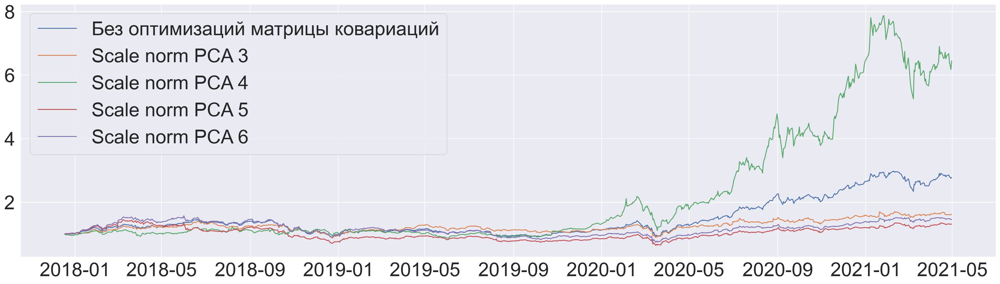

In [196]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(scaled_norm_pca_4_ret.index, scaled_norm_pca_3_ret, label='Scale norm PCA 3')
plt.plot(scaled_norm_pca_4_ret.index, scaled_norm_pca_4_ret, label='Scale norm PCA 4')
plt.plot(portfolio_return_scaled_pca_12.index, scaled_norm_pca_5_ret, label='Scale norm PCA 5')
plt.plot(portfolio_return_scaled_pca_4.index, scaled_norm_pca_6_ret, label='Scale norm PCA 6')
plt.legend(loc='upper left');

In [189]:
(1 + returns_test[top_returns.columns]).prod()

NFLX     2.700954
TSLA    10.328578
NKTR     0.344679
NVDA     3.160782
ABMD     1.699594
STZ      1.124351
ALGN     2.549827
AVGO     1.952492
INCY     0.885643
ILMN     1.813856
MU       2.029990
NXPI     1.710307
TTWO     1.577273
DXCM     6.769164
REGN     1.237393
MPWR     3.319286
DAL      0.886808
LUV      0.998477
CSC      1.000000
VRTX     1.495826
dtype: float64

In [191]:
def get_pca_test_returns_weights(df, kept_components):
    pca = PCA(n_components=df.shape[1])
    pca.fit(df)
    transformed_top_returns = pca.transform(df)

    transformed_top_returns[:,kept_components:] = 0

    simplified_returns = pca.inverse_transform(transformed_top_returns)

    mu = np.mean(top_returns.to_numpy(), axis=0)

    R = 2e-3
    Sigma = np.cov(simplified_returns.T)

    w = decrease_risk(mu, Sigma, R)
    return w

In [192]:
get_pca_test_returns_weights(top_returns_norm_scaled, 4)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 23 05:18:00 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 23 05:18:00 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 23 05:18:00 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 23 05:18:00 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 23 05:18:00 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 23 05:18:00 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

array([ 1.50540009e-01,  5.51030798e-01, -1.56706274e-07,  1.23149074e-06,
       -1.18983534e-06, -8.28895917e-07, -5.08379643e-07,  1.33339814e-06,
       -4.20218621e-08,  1.06762064e-08,  1.27045567e-06,  1.40952629e-06,
        3.50212535e-07, -1.30613359e-06,  9.66192109e-03,  1.31882735e-06,
        1.55091411e-01, -1.04187545e-07,  5.46427025e-07,  1.33672526e-01])

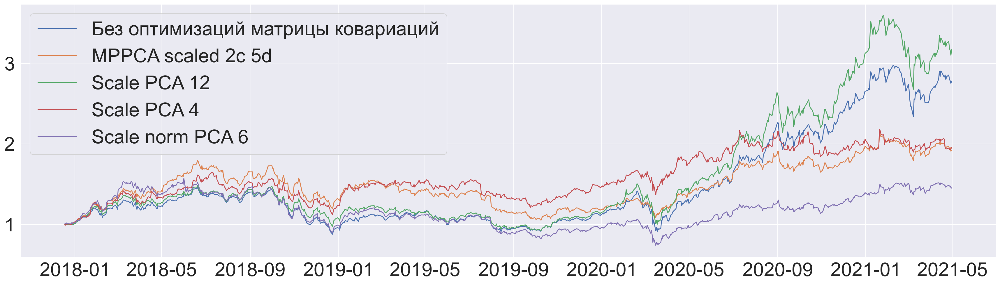

In [193]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(mppca_2_8_ret.index, mppca_scaled_2_5_ret, label='MPPCA scaled 2c 5d')
plt.plot(portfolio_return_scaled_pca_12.index, portfolio_return_scaled_pca_12, label='Scale PCA 12')
plt.plot(portfolio_return_scaled_pca_4.index, portfolio_return_scaled_pca_4, label='Scale PCA 4')
plt.plot(portfolio_return_scaled_pca_4.index, scaled_norm_pca_6_ret, label='Scale norm PCA 6')
plt.legend(loc='upper left');

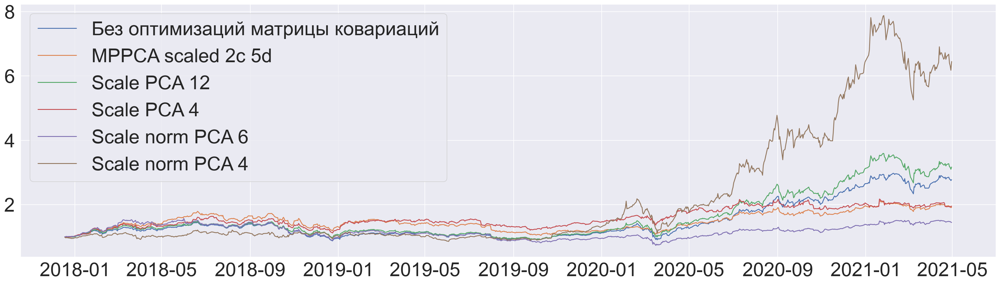

In [194]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(mppca_2_8_ret.index, mppca_scaled_2_5_ret, label='MPPCA scaled 2c 5d')
plt.plot(portfolio_return_scaled_pca_12.index, portfolio_return_scaled_pca_12, label='Scale PCA 12')
plt.plot(portfolio_return_scaled_pca_4.index, portfolio_return_scaled_pca_4, label='Scale PCA 4')
plt.plot(portfolio_return_scaled_pca_4.index, scaled_norm_pca_6_ret, label='Scale norm PCA 6')
plt.plot(scaled_norm_pca_4_ret.index, scaled_norm_pca_4_ret, label='Scale norm PCA 4')
plt.legend(loc='upper left');

In [199]:
mppca_norm_scaled_3_4_ret = get_mppca_test_returns(top_returns_norm_scaled.to_numpy(), 3, 4)
mppca_norm_scaled_3_6_ret = get_mppca_test_returns(top_returns_norm_scaled.to_numpy(), 3, 6)
mppca_norm_scaled_3_3_ret = get_mppca_test_returns(top_returns_norm_scaled.to_numpy(), 3, 3)
mppca_norm_scaled_2_3_ret = get_mppca_test_returns(top_returns_norm_scaled.to_numpy(), 2, 3)
mppca_norm_scaled_2_4_ret = get_mppca_test_returns(top_returns_norm_scaled.to_numpy(), 2, 4)
mppca_norm_scaled_2_5_ret = get_mppca_test_returns(top_returns_norm_scaled.to_numpy(), 2, 5)

....................................................................................................===============================================================================
                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 23 05:28:22 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 23 05:28:22 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 23 05:28:22 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 23 05:28:22 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
---------------------------------------------------------------

(CVXPY) Mar 23 05:28:23 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 23 05:28:23 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 23 05:28:23 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing -> SCS
(CVXPY) Mar 23 05:28:23 PM: Applying reduction Dcp2Cone
(CVXPY) Mar 23 05:28:23 PM: Applying reduction CvxAttr2Constr
(CVXPY) Mar 23 05:28:23 PM: Applying reduction ConeMatrixStuffing
(CVXPY) Mar 23 05:28:23 PM: Applying reduction SCS
(CVXPY) Mar 23 05:28:23 PM: Finished problem compilation (took 3.684e-02 seconds).
-------------------------------------------------------------------------------
                                Numerical solver                 

(CVXPY) Mar 23 05:28:24 PM: Applying reduction SCS
(CVXPY) Mar 23 05:28:24 PM: Finished problem compilation (took 3.564e-02 seconds).
-------------------------------------------------------------------------------
                                Numerical solver                               
-------------------------------------------------------------------------------
(CVXPY) Mar 23 05:28:24 PM: Invoking solver SCS  to obtain a solution.
------------------------------------------------------------------
	       SCS v3.2.0 - Splitting Conic Solver
	(c) Brendan O'Donoghue, Stanford University, 2012
------------------------------------------------------------------
problem:  variables n: 21, constraints m: 33
cones: 	  z: primal zero / dual free vars: 2
	  l: linear vars: 20
	  q: soc vars: 11, qsize: 1
settings: eps_abs: 1.0e-05, eps_rel: 1.0e-05, eps_infeas: 1.0e-07
	  alpha: 1.50, scale: 1.00e-01, adaptive_scale: 1
	  max_iters: 100000, normalize: 1, rho_x: 1.00e-06
	  acceleration_

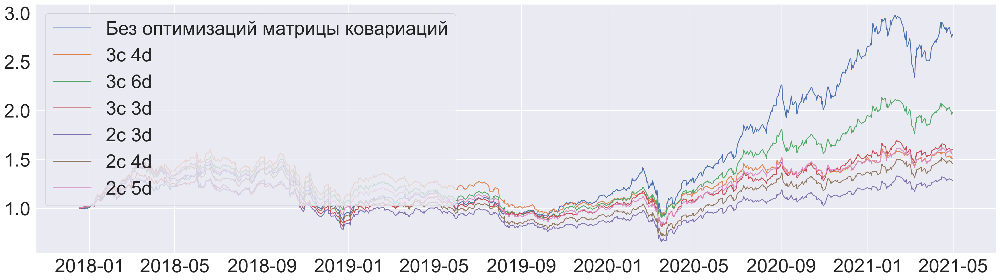

In [203]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(portfolio_return_no_opt.index, mppca_norm_scaled_3_4_ret, label='3c 4d')
plt.plot(portfolio_return_no_opt.index, mppca_norm_scaled_3_6_ret, label='3c 6d')
plt.plot(portfolio_return_no_opt.index, mppca_norm_scaled_3_3_ret, label='3c 3d')
plt.plot(portfolio_return_no_opt.index, mppca_norm_scaled_2_3_ret, label='2c 3d')
plt.plot(portfolio_return_no_opt.index, mppca_norm_scaled_2_4_ret, label='2c 4d')
plt.plot(portfolio_return_no_opt.index, mppca_norm_scaled_2_5_ret, label='2c 5d')
plt.legend(loc='upper left');

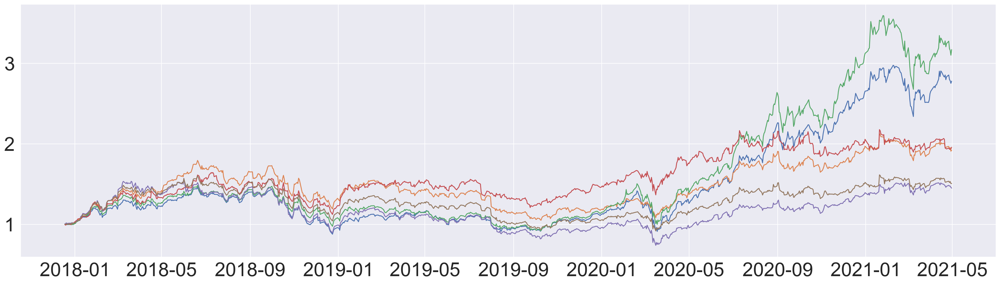

In [205]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(mppca_2_8_ret.index, mppca_scaled_2_5_ret, label='MPPCA scaled 2c 5d')
plt.plot(portfolio_return_scaled_pca_12.index, portfolio_return_scaled_pca_12, label='Scale PCA 12')
plt.plot(portfolio_return_scaled_pca_4.index, portfolio_return_scaled_pca_4, label='Scale PCA 4')
plt.plot(portfolio_return_scaled_pca_4.index, scaled_norm_pca_6_ret, label='Scale norm PCA 6')
plt.plot(portfolio_return_no_opt.index, mppca_norm_scaled_3_4_ret, label='MPPCA norm scaled 3c 4d')
# plt.legend(loc='upper left');

In [206]:
scaled_norm_pca_12_ret = get_pca_test_returns(top_returns_norm_scaled, 12)

                                     CVXPY                                     
                                    v1.1.18                                    
(CVXPY) Mar 23 05:33:21 PM: Your problem has 20 variables, 22 constraints, and 0 parameters.
(CVXPY) Mar 23 05:33:21 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Mar 23 05:33:21 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Mar 23 05:33:21 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Mar 23 05:33:21 PM: Compiling problem (target solver=SCS).
(CVXPY) Mar 23 05:33:21 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing ->

Вот пока что лучшее.

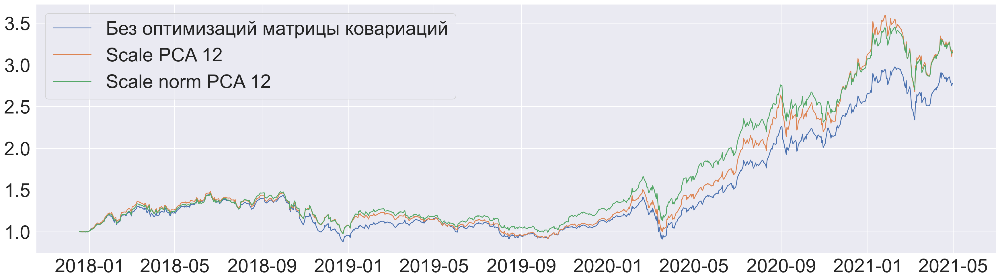

In [209]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(portfolio_return_scaled_pca_12.index, portfolio_return_scaled_pca_12, label='Scale PCA 12')
plt.plot(portfolio_return_scaled_pca_12.index, scaled_norm_pca_12_ret, label='Scale norm PCA 12')
plt.legend(loc='upper left');

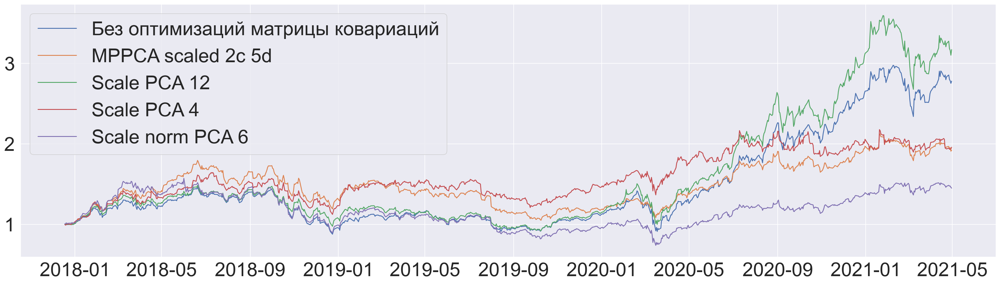

In [210]:
plt.figure(figsize=(30, 8))
plt.plot(portfolio_return_no_opt.index, portfolio_return_no_opt, label='Без оптимизаций матрицы ковариаций')
plt.plot(mppca_2_8_ret.index, mppca_scaled_2_5_ret, label='MPPCA scaled 2c 5d')
plt.plot(portfolio_return_scaled_pca_12.index, portfolio_return_scaled_pca_12, label='Scale PCA 12')
plt.plot(portfolio_return_scaled_pca_4.index, portfolio_return_scaled_pca_4, label='Scale PCA 4')
plt.plot(portfolio_return_scaled_pca_4.index, scaled_norm_pca_6_ret, label='Scale norm PCA 6')
plt.legend(loc='upper left');

In [211]:
(1 + top_returns[top_returns.columns]).prod()

NFLX    19.206671
TSLA    12.024085
NKTR    10.167545
NVDA    14.906499
ABMD    10.215333
STZ     11.165088
ALGN     9.842802
AVGO    10.118720
INCY     6.422128
ILMN     7.105403
MU       6.739982
NXPI     7.570407
TTWO     8.205940
DXCM     6.126955
REGN     7.017537
MPWR     8.141686
DAL      7.361687
LUV      7.898454
CSC      7.365891
VRTX     4.391591
dtype: float64